In [1]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import noisy_moose as nm
import pickle
import os
from multiprocessing import Pool
import datetime
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
#own files
from Remove_Outlier import prepmovavgfunc as pmf
from create_X_and_Y import produce_dataset


# data_files_active = os.listdir("../output/waterfall/active/")

# vzlusat_active = list(i for i in data_files_active if "VZLUSAT-2" in i)

data_files_active = os.listdir("../output/VZLUSAT/water/")

vzlusat_active = list(i for i in data_files_active if "VZLUSAT-2" in i)


# List of bad files to exclude
bad_files = [
    # "VZLUSAT-2_20241012T215504",
    # "VZLUSAT-2_20241015T201954",
    # "VZLUSAT-2_20241016T181904",
    # "VZLUSAT-2_20241029T082929",
    # "VZLUSAT-2_20241029T100144",
    # "VZLUSAT-2_20241030T092934",
    # "VZLUSAT-2_20241106T192716",
    # "VZLUSAT-2_20241114T103154",
    # "VZLUSAT-2_20241115T082607",
    # "VZLUSAT-2_20241119T104843",
    # "VZLUSAT-2_20241120T084215",
    # "VZLUSAT-2_20241120T205344",
    # "VZLUSAT-2_20241121T111348",
    # "VZLUSAT-2_20241121T201934",
    # "VZLUSAT-2_20241121T215402" # all the above ones are removed because they have signal power above 33 dBm which can only be due to interference
    #the below ones are removed because they have more datapoints in a row than possible from the transmission alone
    # ,'VZLUSAT-2_20241015T184843', 'VZLUSAT-2_20241016T090827', 'VZLUSAT-2_20241019T090728', 'VZLUSAT-2_20241019T212114', 'VZLUSAT-2_20241020T083624', 'VZLUSAT-2_20241021T093718', 'VZLUSAT-2_20241021T111042', 'VZLUSAT-2_20241021T201734', 'VZLUSAT-2_20241022T090555', 'VZLUSAT-2_20241023T083445', 'VZLUSAT-2_20241023T100710', 'VZLUSAT-2_20241025T211716', 'VZLUSAT-2_20241028T090106', 'VZLUSAT-2_20241029T113526', 'VZLUSAT-2_20241029T190948', 'VZLUSAT-2_20241029T221741', 'VZLUSAT-2_20241101T082545', 'VZLUSAT-2_20241104T112620', 'VZLUSAT-2_20241105T092004', 'VZLUSAT-2_20241106T102001', 'VZLUSAT-2_20241107T112021', 'VZLUSAT-2_20241110T201927', 'VZLUSAT-2_20241110T215359', 'VZLUSAT-2_20241111T090656', 'VZLUSAT-2_20241111T103945', 'VZLUSAT-2_20241112T083354', 'VZLUSAT-2_20241113T093235', 'VZLUSAT-2_20241113T110546', 'VZLUSAT-2_20241113T184111', 'VZLUSAT-2_20241114T085912', 'VZLUSAT-2_20241114T180947', 'VZLUSAT-2_20241115T095807', 'VZLUSAT-2_20241115T221248', 'VZLUSAT-2_20241116T105729', 'VZLUSAT-2_20241118T112258', 'VZLUSAT-2_20241119T091548', 'VZLUSAT-2_20241121T080916', 'VZLUSAT-2_20241122T103926', 'VZLUSAT-2_20241125T193601', 'VZLUSAT-2_20241126T203355', 'VZLUSAT-2_20241127T213306', 'VZLUSAT-2_20241128T205750', 'VZLUSAT-2_20241130T104230'
    #the below ones are removed because they have a period with target below 10, many of them are influenced by pointing error
    # ,'VZLUSAT-2_20241015T093930', 'VZLUSAT-2_20241016T104128', 'VZLUSAT-2_20241017T101004', 'VZLUSAT-2_20241018T201901', 'VZLUSAT-2_20241019T104028', 'VZLUSAT-2_20241020T100851', 'VZLUSAT-2_20241025T194405', 'VZLUSAT-2_20241026T100449', 'VZLUSAT-2_20241027T201256', 'VZLUSAT-2_20241028T194113', 'VZLUSAT-2_20241101T095746', 'VZLUSAT-2_20241109T101331', 'VZLUSAT-2_20241111T211928', 'VZLUSAT-2_20241113T201150', 'VZLUSAT-2_20241117T102328', 'VZLUSAT-2_20241118T202840', 'VZLUSAT-2_20241122T090639', 'VZLUSAT-2_20241124T093057', 'VZLUSAT-2_20241124T214354', 'VZLUSAT-2_20241126T112831', 'VZLUSAT-2_20241128T101855'
]

# Filter out bad files
vzlusat_active_filtered = [
    i for i in vzlusat_active if i.split('_pickled')[0] not in bad_files
]

obj_act: list[nm.prepping] = []  # Initialize list


#parameters for the prepmovavgfunc
signal_threshold = -138
peak_level = 3 #3
noise_threshold = -180 #180
window_size = 99

load_all=True

if load_all:
    for i in vzlusat_active_filtered:  # Use filtered list
        try:
            with open(f"../output/VZLUSAT/water/{i}", 'rb') as f:
                obj_act.append(pmf(pickle.loads(f.read()),signal_threshold=signal_threshold,   peak_level=peak_level, noise_threshold = noise_threshold ,  window_size=window_size))
        except FileNotFoundError:
            print(f"File not found: {i}, skipping...")
        except Exception as e:
            print(f"An error occurred while processing {i}: {e}")
else:
    for i in vzlusat_active_filtered[:15]:  # Use filtered list
        try:
            with open(f"../output/VZLUSAT/water/{i}", 'rb') as f:
                obj_act.append(pmf(pickle.loads(f.read()),signal_threshold=signal_threshold,   peak_level=peak_level, noise_threshold = noise_threshold ,  window_size=window_size))
        except FileNotFoundError:
            print(f"File not found: {i}, skipping...")
        except Exception as e:
            print(f"An error occurred while processing {i}: {e}")

print(f"Loaded {len(obj_act)} files")

Loaded 203 files


In [41]:
#Produce dataset from the objects. Reduces the resolution, adds features that make the x'es independent and normalises it.
X, Y, X_test, y_test, n_train_test_sets, n_test_sets, weights, weights_test = produce_dataset(obj_act, test_split = 0.3 ,pred_range = 10)
print(f"number of test/train sets: {n_train_test_sets}")
print(f"number of validation sets: {n_test_sets}")

#scaling
X_combined = np.vstack(X)
y_combined = np.hstack(Y)
# X_combined = np.squeeze(X)

scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X_combined)
X_test_normalized = []
for i in range(len(X_test)):
    X_test_normalized.append(scaler.transform(X_test[i]))
    # print(f"X_val shape: {len(X_val[i])}")

scaler = MinMaxScaler()
weights=np.hstack(weights)
weights = np.array(scaler.fit_transform(weights.reshape(-1, 1))).flatten()
weights_test_normalized = []
for i in range(len(weights_test)):
    weights_test_normalized.append(scaler.transform(weights_test[i].reshape(-1, 1)))

# print(f"X normalised: {X_normalized.shape}")
# print(f"y combined: {y_combined.shape}")
# print(f"weights: {weights.shape}")
# print(f"X_val normalised: {len(X_val_normalized)}")
# print(f"X_val: {len(X_val)}")
# print(f"y_val: {len(y_val)}")
# print(f"weights_val: {len(weights_val_normalized)}")


# Splitting the dataset into training and testing sets
train_X=X_normalized
train_y=y_combined

Validation=False
if Validation:
    train_X, val_X, train_y, val_y, train_weights, val_weights = train_test_split(
        X_normalized, y_combined, weights, test_size=0.2, random_state=23) 
    # Check the shapes
    print(train_X.shape, train_y.shape, train_weights.shape)
    print(val_X.shape, val_y.shape, val_weights.shape)




number of test/train sets: 132
number of validation sets: 56


# Gradient boosting

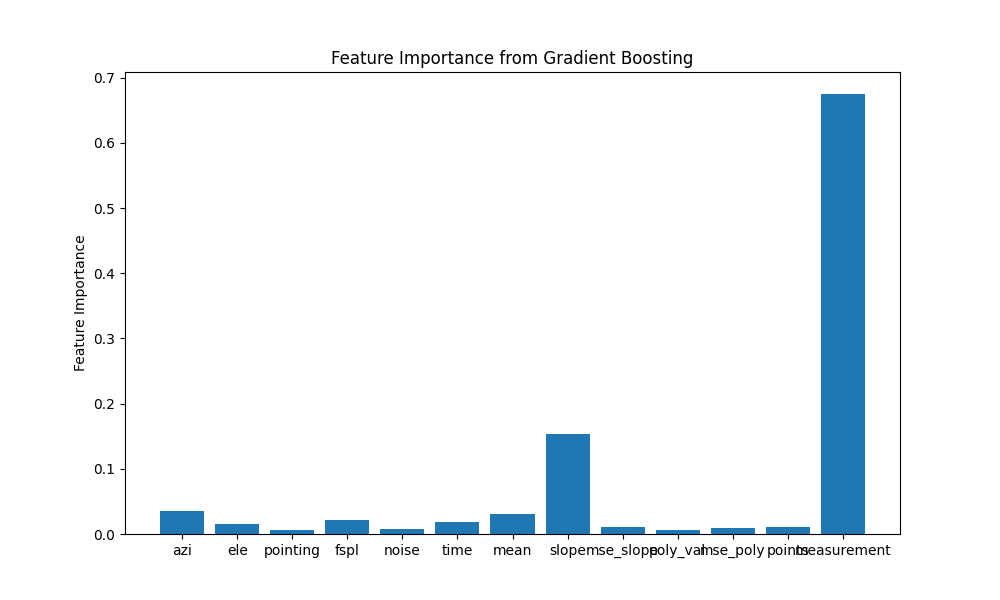

Root Mean Square Error: 1.22


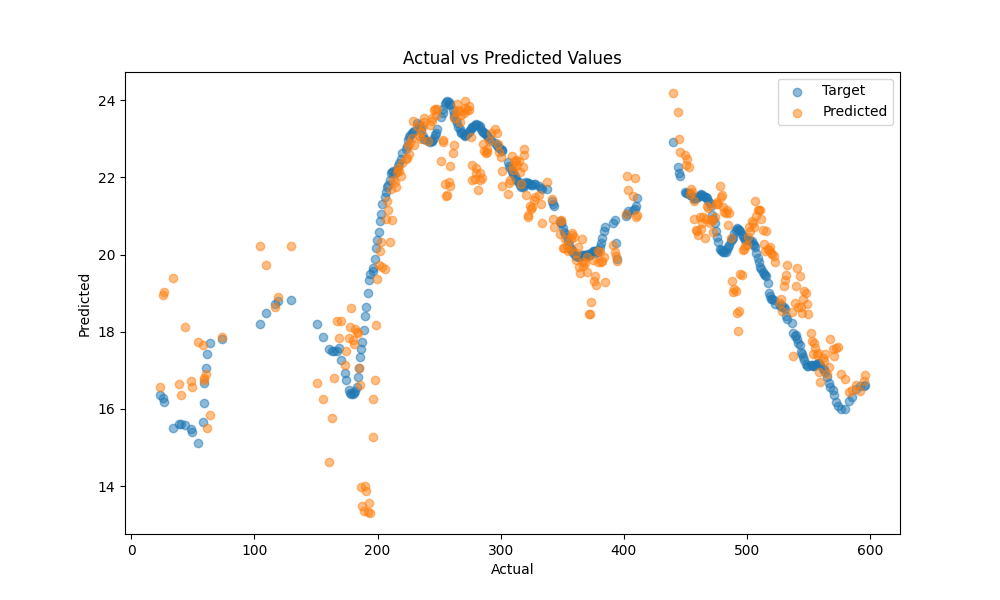

Root Mean Square Error: 1.56


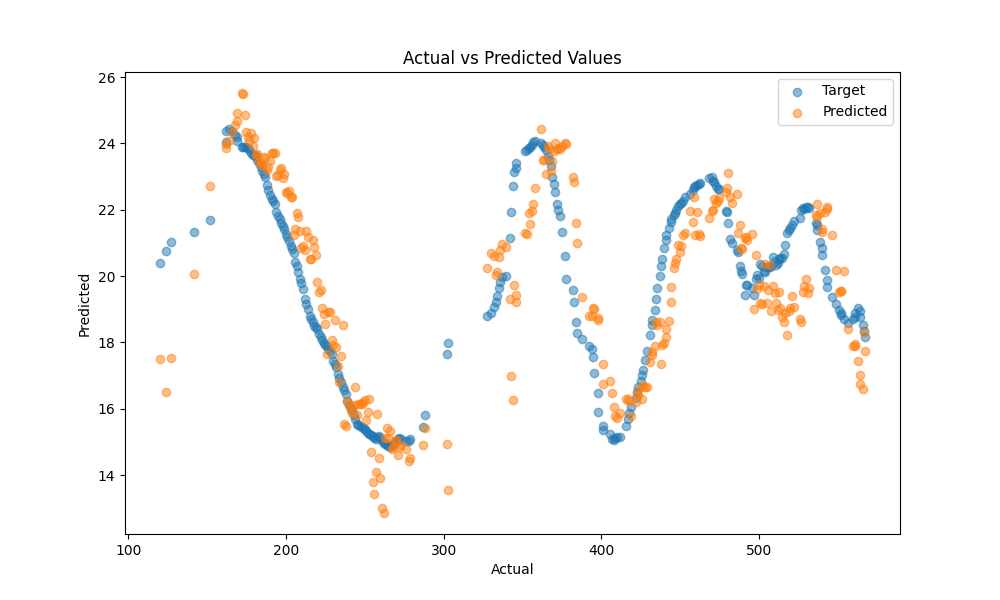

Root Mean Square Error: 2.16


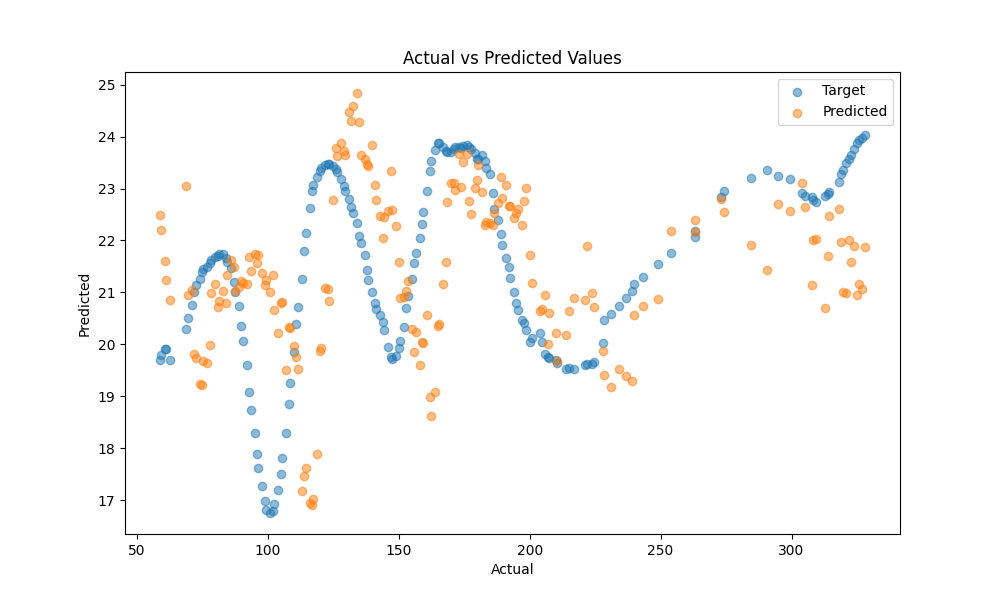

In [42]:
gbr = GradientBoostingRegressor(loss='squared_error',
                                learning_rate=0.1,
                                n_estimators=300,
                                max_depth=10, 
                                random_state=23)

# Fit the model to the training data
# gbr.fit(train_X, train_y, sample_weight = train_weights)
gbr.fit(train_X, train_y, sample_weight = None )
# Optional: Visualizing feature importance

plt.figure(figsize=(10, 6))
plt.bar(range(train_X.shape[1]), gbr.feature_importances_)
plt.xticks(range(train_X.shape[1]), ['azi',       # 0
                                'ele',      # 1
                               'pointing',  # 2
                               'fspl',      # 3
                               'noise',     # 4
                               'time',      # 5
                               'mean',      # 6
                               'slope',     # 7
                               'mse_slope', # 8
                               'poly_val',  # 9
                               'mse_poly',  # 10
                               'points',    # 11
                               'measurement'])   # 12

plt.ylabel('Feature Importance')
plt.title('Feature Importance from Gradient Boosting')
plt.show()
errors=[]
for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized[:3], X_test[:3], y_test[:3], weights_test[:3]):
    pred_y = gbr.predict(test_x_normalized)
    # Compute RMSE (Root Mean Squared Error)
    test_rmse = (mean_squared_error(test_y, pred_y, sample_weight=test_weights) ** (1 / 2))  # weighted RMSE

    errors.append(test_y-pred_y)
    # Print RMSE
    print(f'Root Mean Square Error: {test_rmse:.2f}')

    plt.figure(figsize=(10, 6))
    plt.scatter(test_x[:, 5], test_y, label='Target', alpha=0.5)
    plt.scatter(test_x[:, 5], pred_y, label='Predicted', alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()




# XG Boost

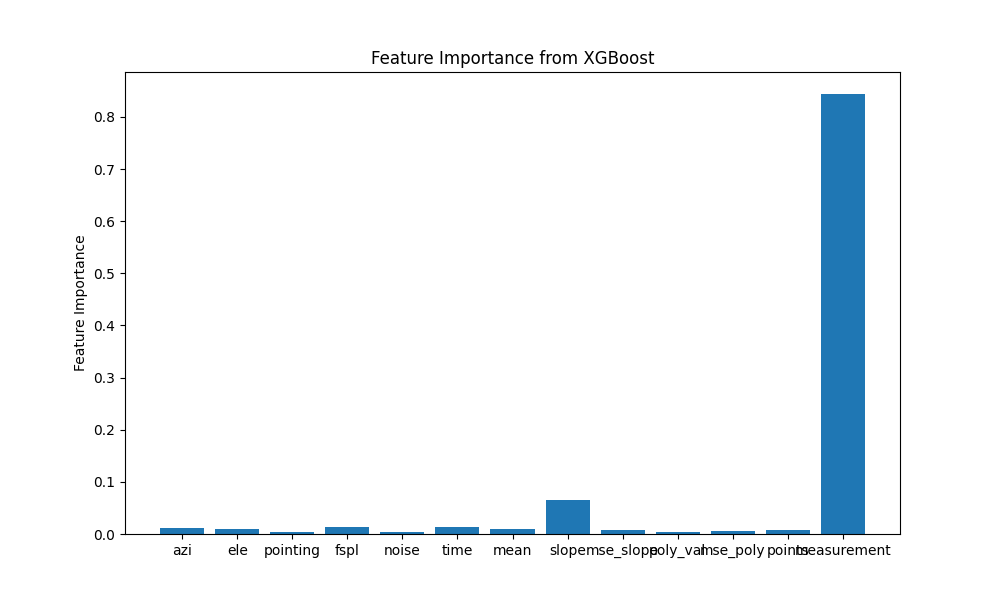

Root Mean Square Error: 1.19


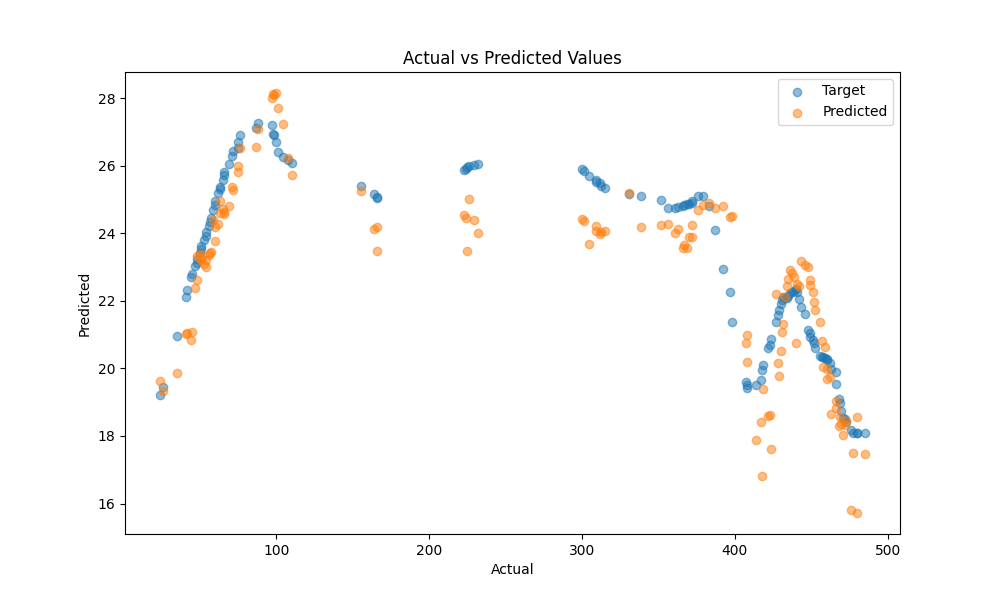

Root Mean Square Error: 0.95


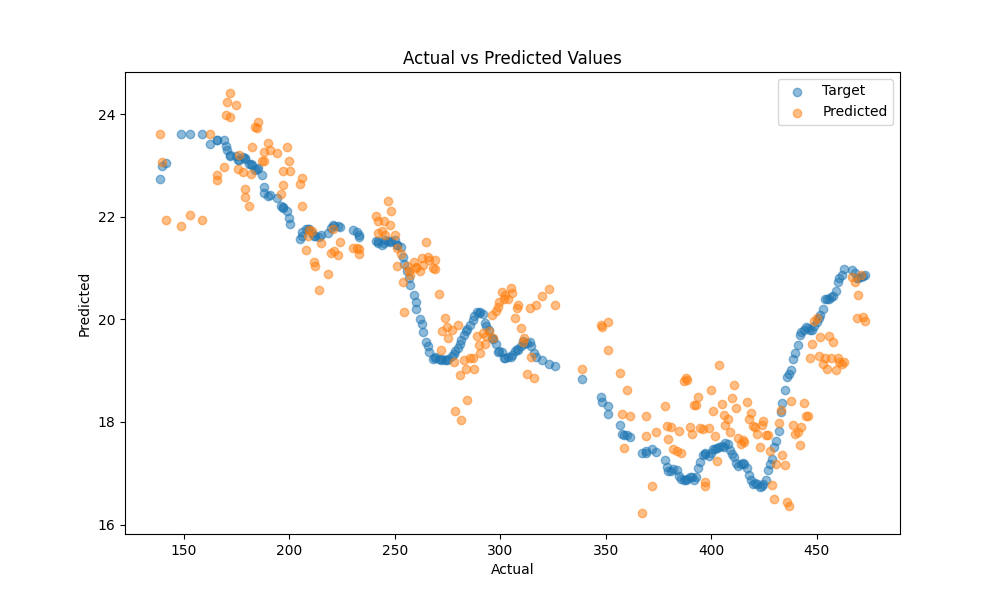

Root Mean Square Error: 0.85


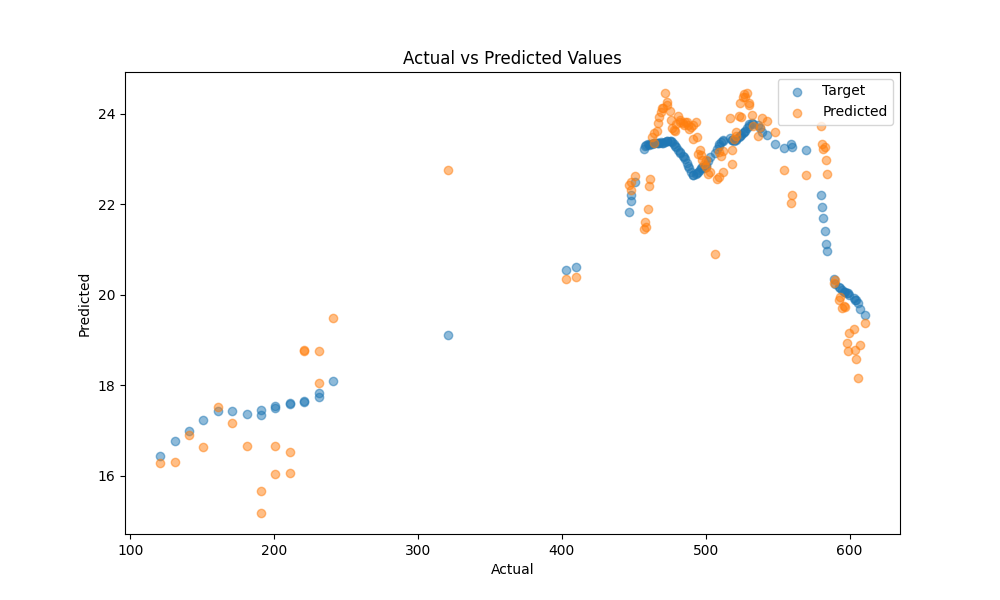

In [ ]:
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Initialize XGBoost Regressor
xgbr = XGBRegressor(objective='reg:squarederror',  # Equivalent to 'squared_error'
                    learning_rate=0.1,
                    n_estimators=300,
                    max_depth=10,
                    random_state=23)

# Fit the model to the training data
xgbr.fit(train_X, train_y, sample_weight=None)

# Optional: Visualizing feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(train_X.shape[1]), xgbr.feature_importances_)
plt.xticks(range(train_X.shape[1]), ['azi',       # 0
                                     'ele',      # 1
                                     'pointing',  # 2
                                     'fspl',      # 3
                                     'noise',     # 4
                                     'time',      # 5
                                     'mean',      # 6
                                     'slope',     # 7
                                     'mse_slope', # 8
                                     'poly_val',  # 9
                                     'mse_poly',  # 10
                                     'points',    # 11
                                     'measurement'])   # 12

plt.ylabel('Feature Importance')
plt.title('Feature Importance from XGBoost')
plt.show()

# Compute errors
errors = []
for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized[:3], X_test[:3], y_test[:3], weights_test[:3]):
    # Predict using the model
    pred_y = xgbr.predict(test_x_normalized)
    
    # Compute RMSE (Root Mean Squared Error)
    test_rmse = (mean_squared_error(test_y, pred_y, sample_weight=test_weights) ** 0.5)  # weighted RMSE
    errors.append(test_y - pred_y)
    
    # Print RMSE
    print(f'Root Mean Square Error: {test_rmse:.2f}')
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(test_x[:, 5], test_y, label='Target', alpha=0.5)
    plt.scatter(test_x[:, 5], pred_y, label='Predicted', alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()



In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import ParameterGrid
from tqdm import tqdm
import numpy as np
from sklearn.metrics import mean_squared_error

# Define the parameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'n_estimators': [100, 300, 500],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Convert param_grid to ParameterGrid for looping
param_combinations = list(ParameterGrid(param_grid))

# Placeholder for tracking the best model and RMSE
best_params = None
best_mse = float('inf')

# Progress bar using tqdm
for params in tqdm(param_combinations, desc="Hyperparameter Tuning", unit="combination"):
    # Initialize the XGBRegressor with current parameters
    model = XGBRegressor(random_state=42, objective='reg:squarederror', **params)
    
    # Fit the model on the training data
    model.fit(train_X, train_y)
    
    # Predict on the validation set
    val_predictions = model.predict(val_X)
    
    # Calculate RMSE on the validation set
    mse = mean_squared_error(val_y, val_predictions)
    
    # Check if this is the best RMSE so far
    if mse < best_mse:
        best_rmse = mse
        best_params = params

# Output the best parameters and RMSE
print("Best Parameters:", best_params)
print("Best Validation MSE:", best_mse)

# Evaluate on the test set using the best parameters
best_model = XGBRegressor(random_state=42, objective='reg:squarederror', **best_params)
best_model.fit(train_X, train_y)
test_predictions = best_model.predict(X_test_normalized)
test_mse = mean_squared_error(y_test, test_predictions)
print(f"Test MSE: {test_mse:.2f}")


Hyperparameter Tuning: 100%|██████████| 108/108 [02:22<00:00,  1.32s/combination]


Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 500, 'subsample': 1.0}
Best Validation RMSE: 1.6478662166442035


NameError: name 'test_X' is not defined

# Linear Regression

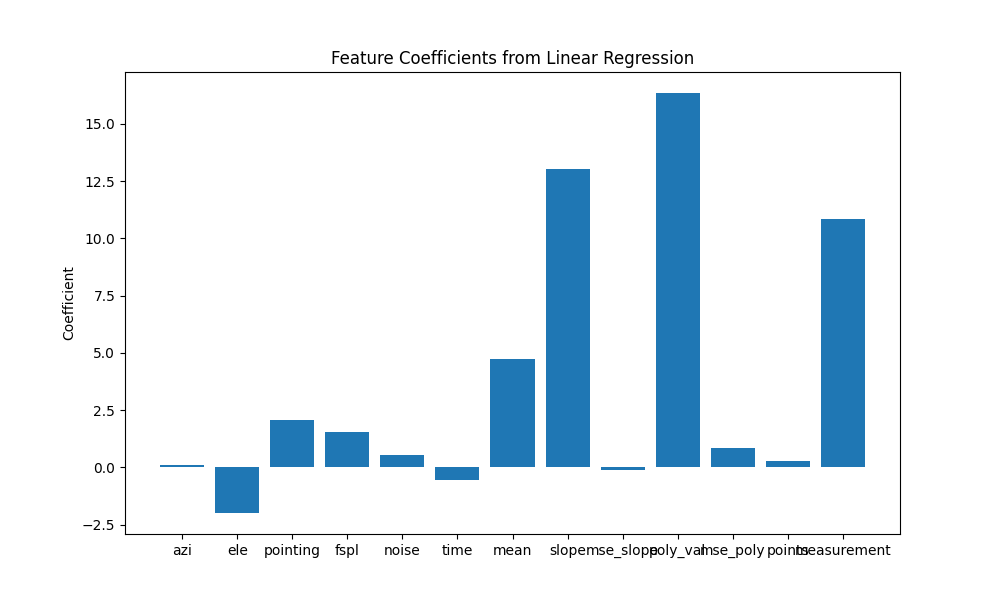

Root Mean Square Error: 1.25


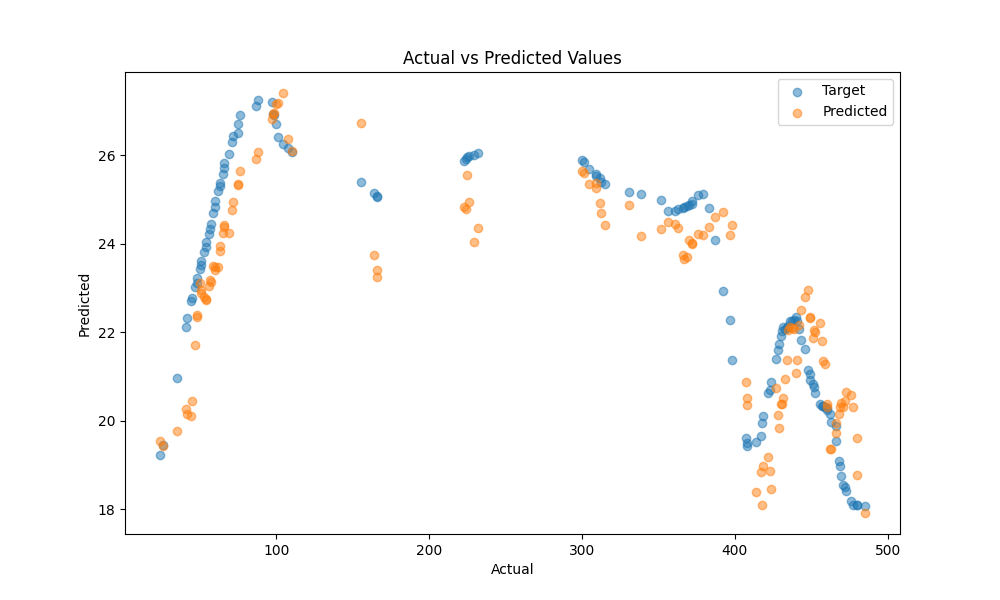

Root Mean Square Error: 0.94


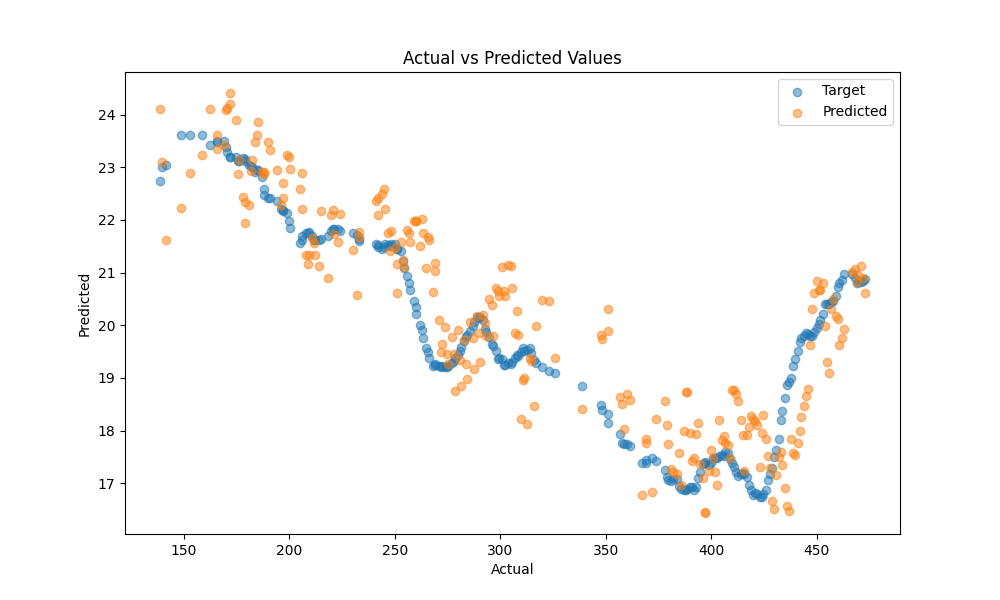

Root Mean Square Error: 0.78


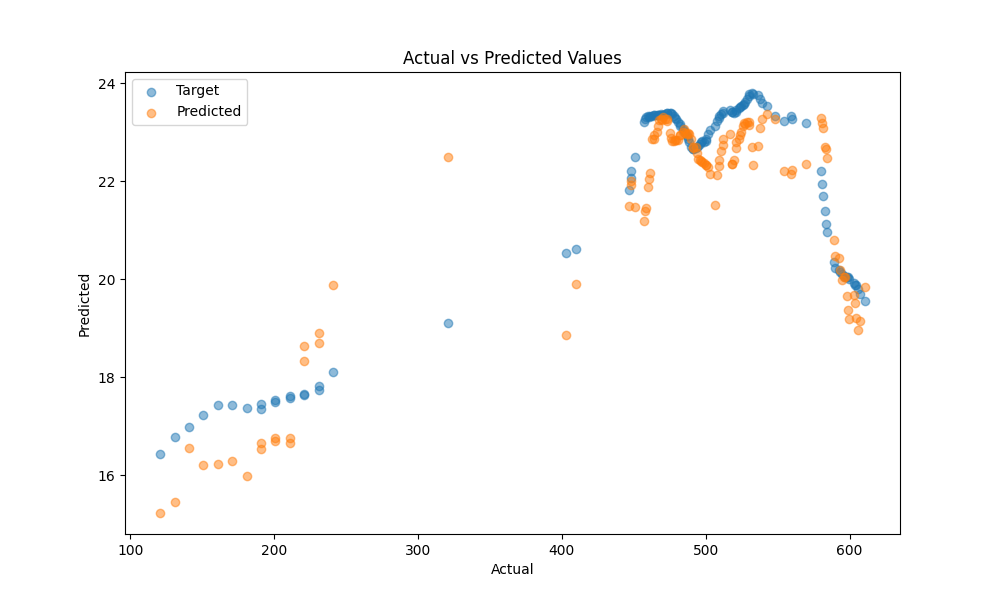

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Create the Linear Regression model
lr = LinearRegression()

# Fit the model to the training data
lr.fit(train_X, train_y, sample_weight=None)

# Visualizing coefficients (importance of each feature)
plt.figure(figsize=(10, 6))
plt.bar(range(train_X.shape[1]), lr.coef_)
plt.xticks(range(train_X.shape[1]), ['azi',       # 0
                                      'ele',      # 1
                                      'pointing',  # 2
                                      'fspl',      # 3
                                      'noise',     # 4
                                      'time',      # 5
                                      'mean',      # 6
                                      'slope',     # 7
                                      'mse_slope', # 8
                                      'poly_val',  # 9
                                      'mse_poly',  # 10
                                      'points',    # 11
                                      'measurement'])   # 12
plt.ylabel('Coefficient')
plt.title('Feature Coefficients from Linear Regression')
plt.show()

# Compute RMSE and plot actual vs predicted for each fold of the validation set
errors = []
for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized[:3], X_test[:3], y_test[:3], weights_test[:3]):
    # Predict using the model
    pred_y = lr.predict(test_x_normalized)
    
    # Compute RMSE (Root Mean Squared Error)
    # test_mse = mean_squared_error(test_y, pred_y, sample_weight=test_weights)  # weighted MSE
    test_mse = mean_squared_error(test_y, pred_y, sample_weight=None)
    errors.append(test_y - pred_y)
    
    # Print RMSE
    print(f'Mean Square Error: {test_mse:.2f}')
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(test_x[:, 5], test_y, label='Target', alpha=0.5)
    plt.scatter(test_x[:, 5], pred_y, label='Predicted', alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()



# Lightgbm

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3220
[LightGBM] [Info] Number of data points in the train set: 31678, number of used features: 13
[LightGBM] [Info] Start training from score 21.201845


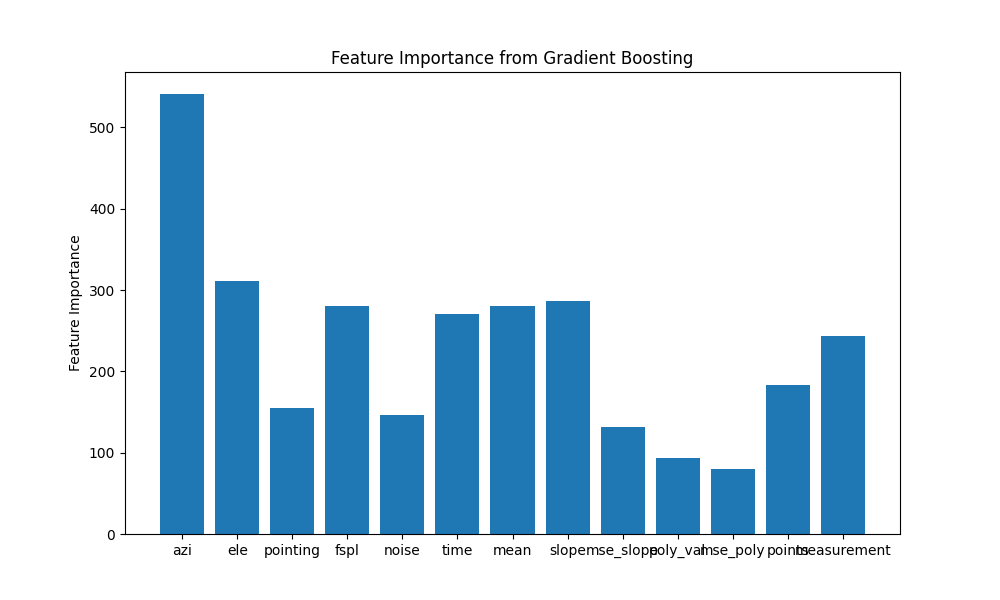

Mean Square Error: 1.35


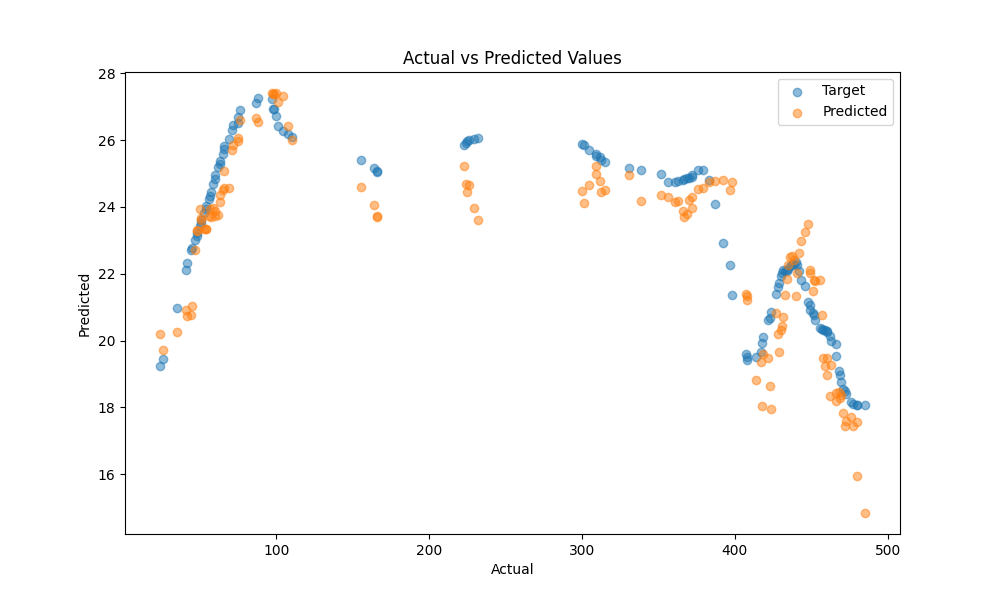

Mean Square Error: 0.97


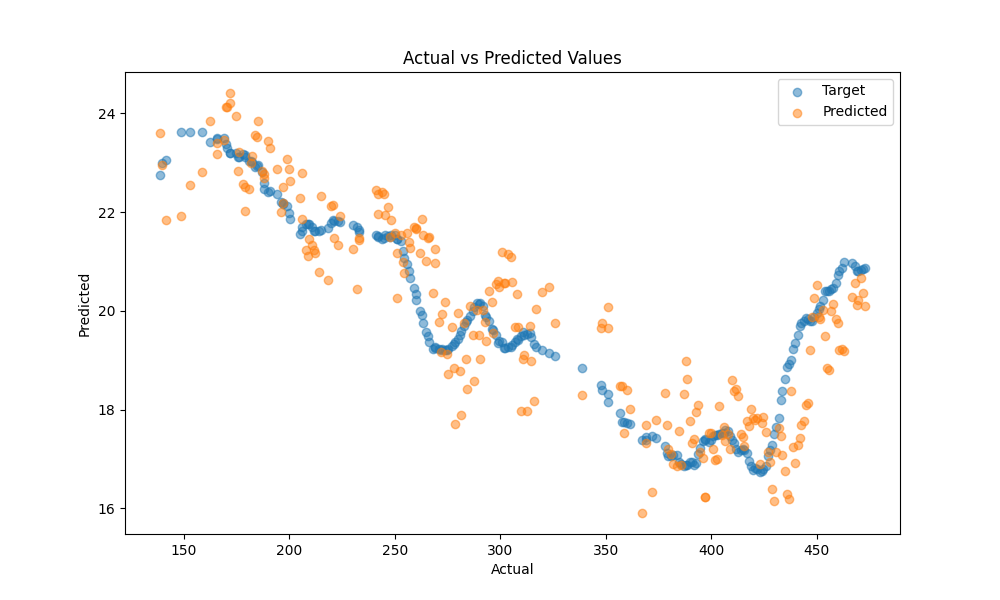

Mean Square Error: 0.60


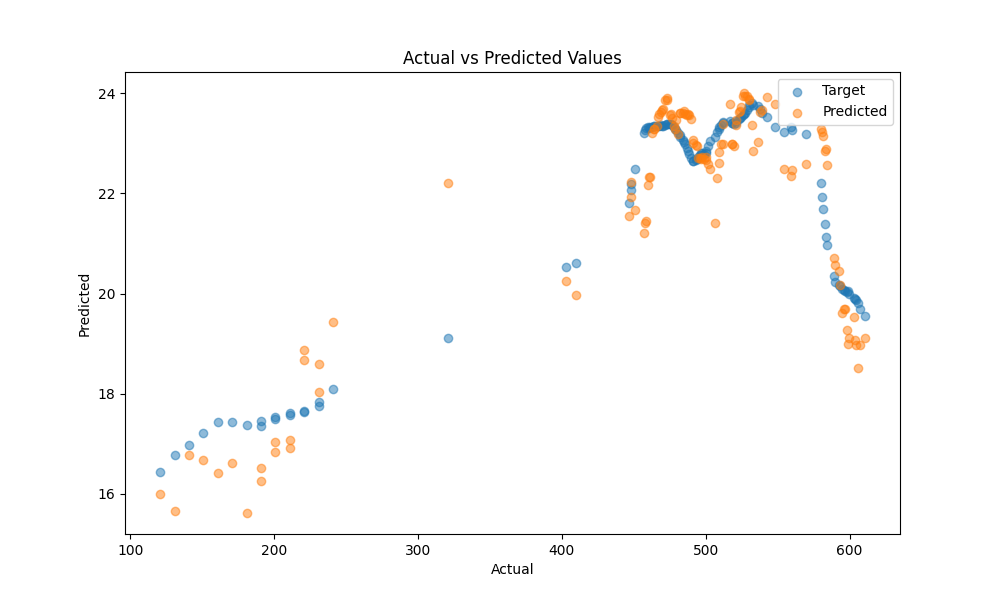

In [6]:
# build the lightgbm model
import lightgbm
lgb = lightgbm.LGBMRegressor()
lgb.fit(train_X, train_y)

plt.figure(figsize=(10, 6))
plt.bar(range(train_X.shape[1]), lgb.feature_importances_)
plt.xticks(range(train_X.shape[1]), ['azi',       # 0
                                'ele',      # 1
                               'pointing',  # 2
                               'fspl',      # 3
                               'noise',     # 4
                               'time',      # 5
                               'mean',      # 6
                               'slope',     # 7
                               'mse_slope', # 8
                               'poly_val',  # 9
                               'mse_poly',  # 10
                               'points',    # 11
                               'measurement'])   # 12

plt.ylabel('Feature Importance')
plt.title('Feature Importance from Gradient Boosting')
plt.show()
from sklearn.metrics import accuracy_score
for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized[:3], X_test[:3], y_test[:3], weights_test[:3]):
    # Predict using the model
    pred_y = lgb.predict(test_x_normalized)
    
    # Compute RMSE (Root Mean Squared Error)
    # test_mse = mean_squared_error(test_y, pred_y, sample_weight=test_weights)  # weighted MSE
    test_mse = mean_squared_error(test_y, pred_y, sample_weight=None)
    errors.append(test_y - pred_y)
    
    # Print RMSE
    print(f'Mean Square Error: {test_mse:.2f}')
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(test_x[:, 5], test_y, label='Target', alpha=0.5)
    plt.scatter(test_x[:, 5], pred_y, label='Predicted', alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()

# predict the results
# y_pred=clf.predict(test_X)
# # check the accuracy
# test_rmse = (mean_squared_error(test_y, y_pred) ** (1 / 2)) #weighted RMSE
# print(test_rmse)

# Random forrest

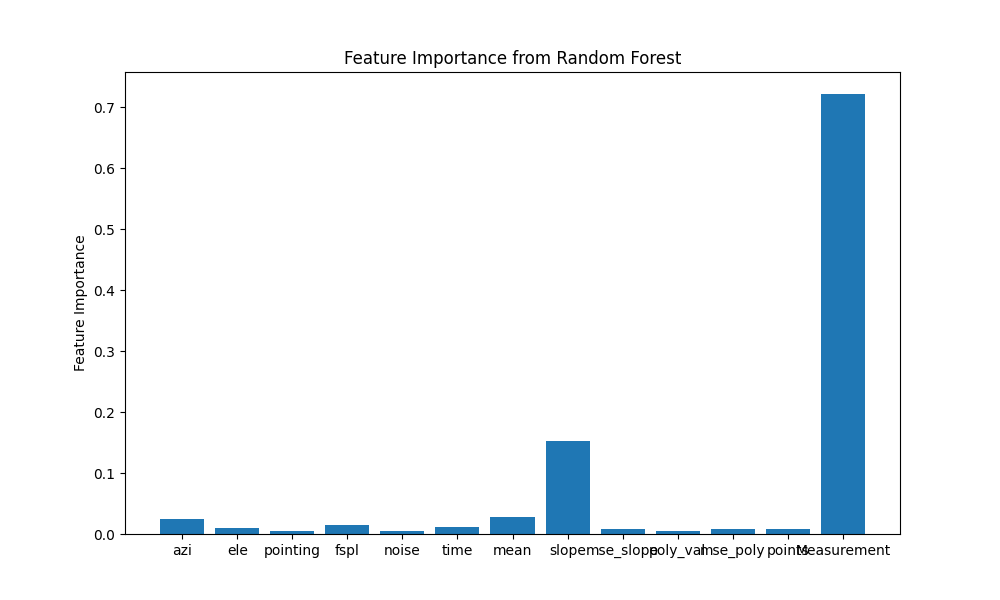

Mean Square Error: 1.42


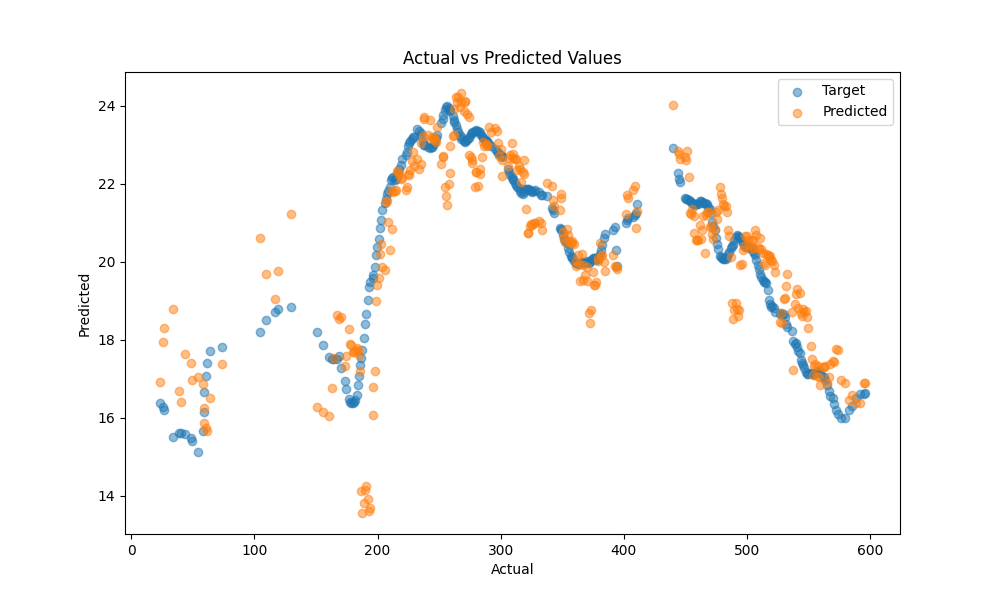

Mean Square Error: 2.45


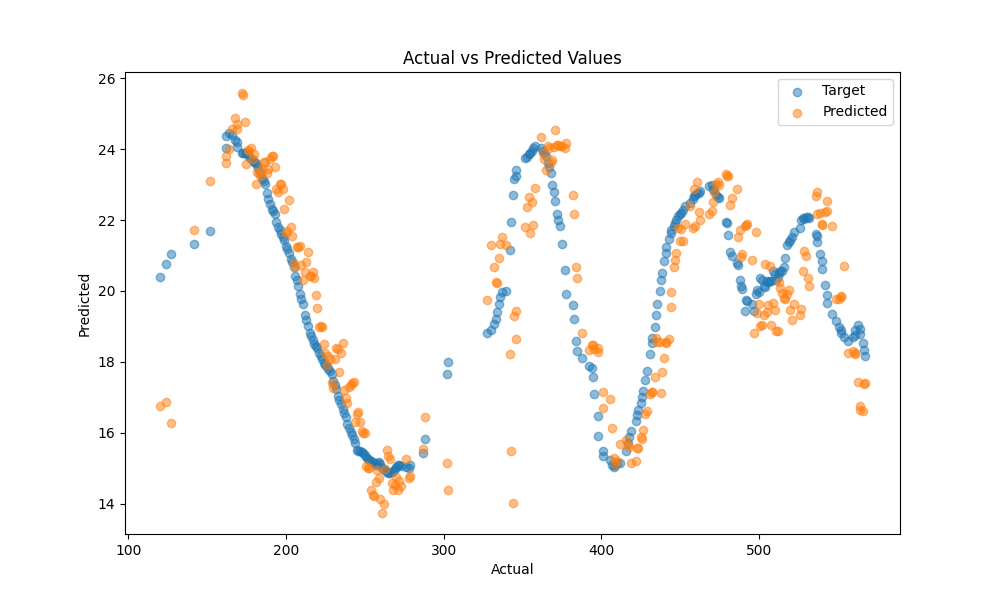

Mean Square Error: 4.46


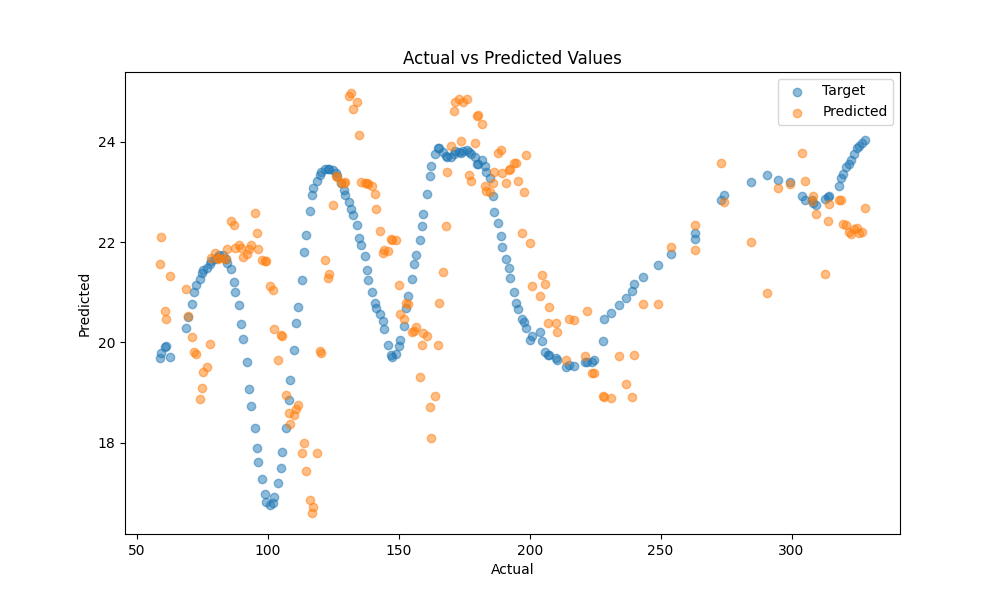

In [43]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Initialize the RandomForestRegressor
rfr = RandomForestRegressor(
    n_estimators=300,     # Number of trees in the forest
    max_depth=13,         # Maximum depth of each tree
    random_state=23,      # For reproducibility
    n_jobs=-1             # Use all available CPU cores
)

# Fit the model to the training data
# rfr.fit(train_X, train_y, sample_weight=train_weights)
rfr.fit(train_X, train_y, sample_weight=None)

# Visualizing feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(train_X.shape[1]), rfr.feature_importances_)
plt.xticks(range(train_X.shape[1]), ['azi',       # 0
                                     'ele',      # 1
                                     'pointing',  # 2
                                     'fspl',      # 3
                                     'noise',     # 4
                                     'time',      # 5
                                     'mean',      # 6
                                     'slope',     # 7
                                     'mse_slope', # 8
                                     'poly_val',  # 9
                                     'mse_poly',  # 10
                                     'points',   # 11
                                     'Measurement'])   # 12
plt.ylabel('Feature Importance')
plt.title('Feature Importance from Random Forest')
plt.show()
from sklearn.metrics import accuracy_score
for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized[:3], X_test[:3], y_test[:3], weights_test[:3]):
    # Predict using the model
    pred_y = rfr.predict(test_x_normalized)
    
    # Compute RMSE (Root Mean Squared Error)
    # test_mse = mean_squared_error(test_y, pred_y, sample_weight=test_weights)  # weighted MSE
    test_mse = mean_squared_error(test_y, pred_y, sample_weight=None)
    errors.append(test_y - pred_y)
    
    # Print RMSE
    print(f'Mean Square Error: {test_mse:.2f}')
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(test_x[:, 5], test_y, label='Target', alpha=0.5)
    plt.scatter(test_x[:, 5], pred_y, label='Predicted', alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()

# predict the results
# y_pred=clf.predict(test_X)
# # check the accuracy
# test_rmse = (mean_squared_error(test_y, y_pred) ** (1 / 2)) #weighted RMSE
# print(test_rmse)


# Linear Predictive Coding (AR filter basically)

Mean AR Weights: [-0.36653243 -0.24634157 -0.09848334 -0.07889313 -0.05932645 -0.03388694
 -0.02482069 -0.01305698  0.00314231 -0.01009522  0.00518188  0.00990908
  0.01729508  0.00042441  0.01321446 -0.00448956  0.00438047 -0.00227685
  0.00260788 -0.00770509]
Mean Square Error: 2.87


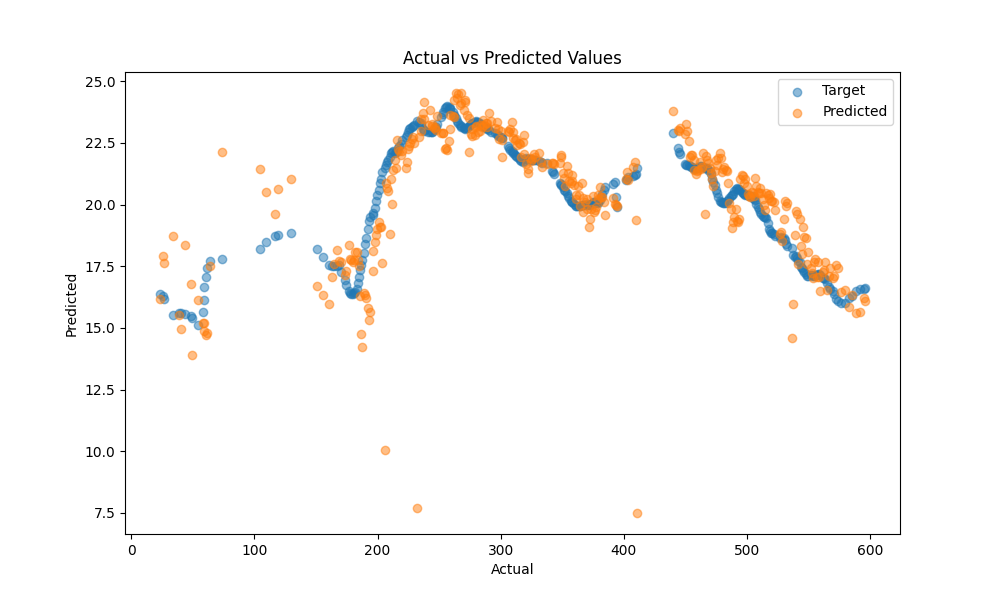

Mean Square Error: 5.27


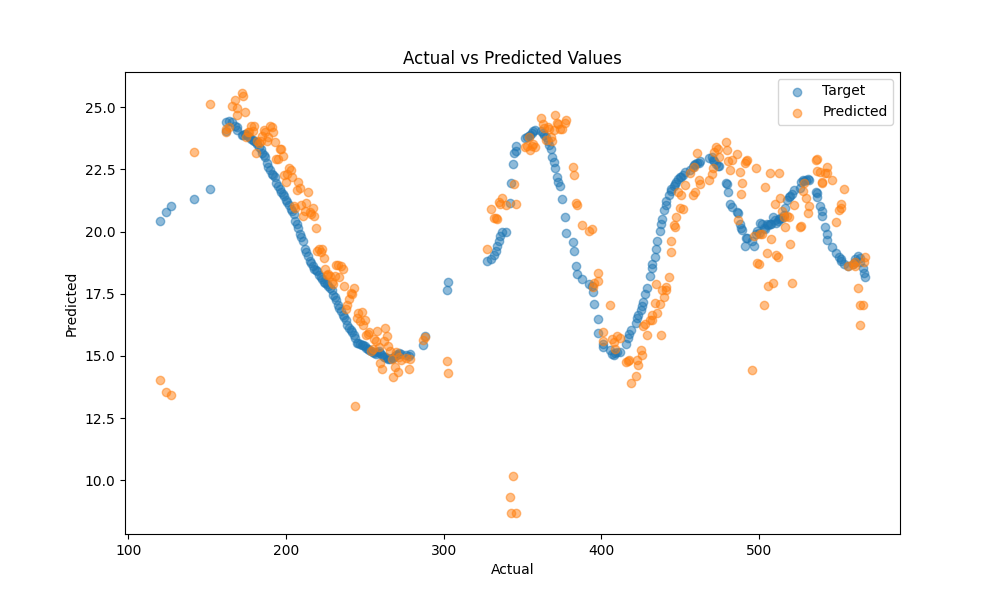

Mean Square Error: 5.16


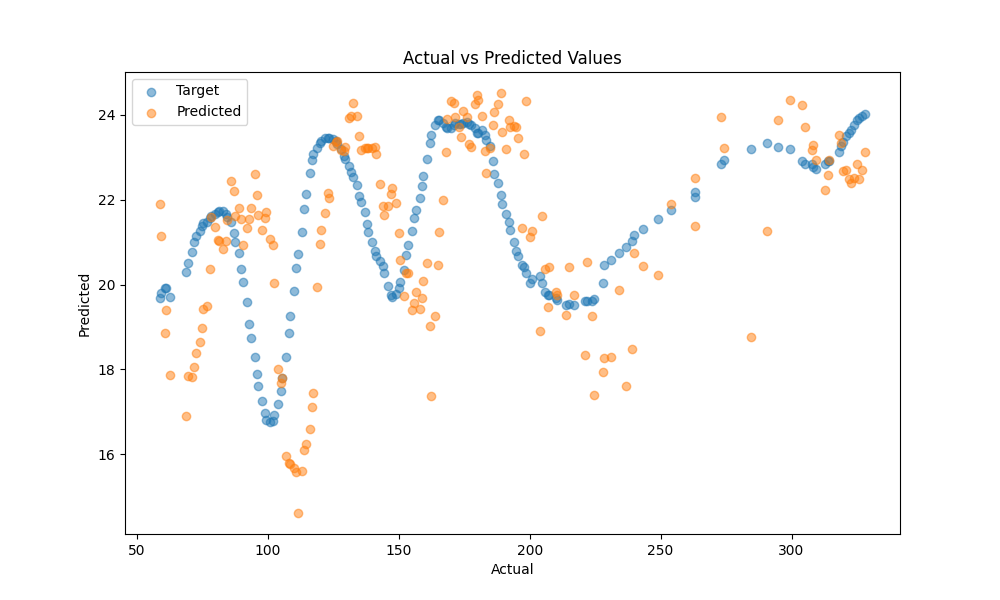

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
from scipy.linalg import toeplitz
from numpy.linalg import inv

diff_data=[]
for x, y in zip(X, Y): #train using the train sets
    diff_data.append(np.diff(x[:,12],1))   # First order differencing
    # diff_data.append(x[:,12]-np.mean(x[:,12])) # Adjust the mean to zero
    # print(f"val_x shape: {val_x.shape}")

AR_weights=[]

for data in diff_data:

    # Calculate the ACF
    lags = 20  # Number of lags to compute
    acf_values = acf(data, nlags=lags, fft=True)  # Use FFT for faster computation
    R=toeplitz(acf_values[0:-1])
    inverse_R=np.linalg.inv(R)
    r=acf_values[1:]

    a=inverse_R@r
    AR_weights.append(a)


AR_weights = np.array(AR_weights)
mean_AR_weights = np.mean(AR_weights, axis=0)

print(f"Mean AR Weights: {mean_AR_weights}")


def forecast_arima(diff_data, a, data, forecast_horizon=10, initial_value=0):
    a = a.reshape(-1, 1)  # Create 2D array to use hstack
    predmatrix = toeplitz(diff_data, np.ones(len(a)) * 0)  # len(data) x a
    prediction = np.dot(predmatrix, a)  # len(data) x 1

    for i in range(1, forecast_horizon):
        predmatrix = np.hstack((prediction, predmatrix[:, :-1]))
        prediction = np.dot(predmatrix, a)

    prediction = np.sum(prediction, axis=1) + data[1:]
    prediction = np.insert(prediction, 0, initial_value)
    
    return prediction




for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized[:3], X_test[:3], y_test[:3], weights_test[:3]):
    # Predict using the model
    pred_y = forecast_arima(np.diff(test_x[:,12],1),a=mean_AR_weights,data=test_x[:,12],forecast_horizon=10, initial_value=test_x[0,12])
    
    # Compute RMSE (Root Mean Squared Error)
    # test_mse = mean_squared_error(test_y, pred_y, sample_weight=test_weights)  # weighted MSE
    test_mse = mean_squared_error(test_y, pred_y, sample_weight=None)
    errors.append(test_y - pred_y)
    
    # Print RMSE
    print(f'Mean Square Error: {test_mse:.2f}')
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(test_x[:, 5], test_y, label='Target', alpha=0.5)
    plt.scatter(test_x[:, 5], pred_y, label='Predicted', alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()
    



# Comparison

Mean error for GBR: 0.045105300964575136
Mean error for RFR: 0.024679411386185963
Mean error for ZOH: 0.000189348136383278
Mean error for VCM: 0.10489519809438823
Mean error for TS: -0.07252129278712799


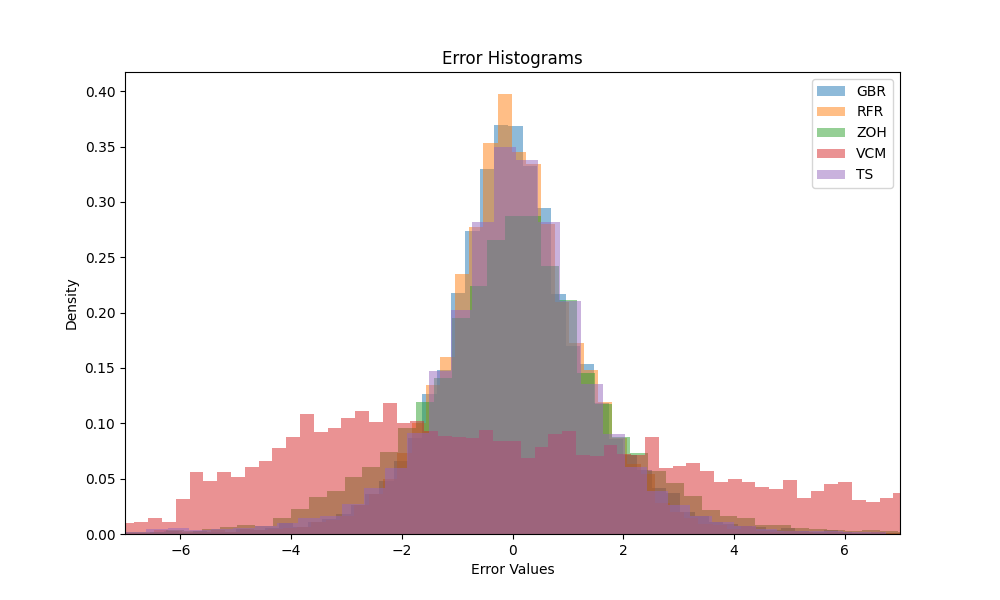

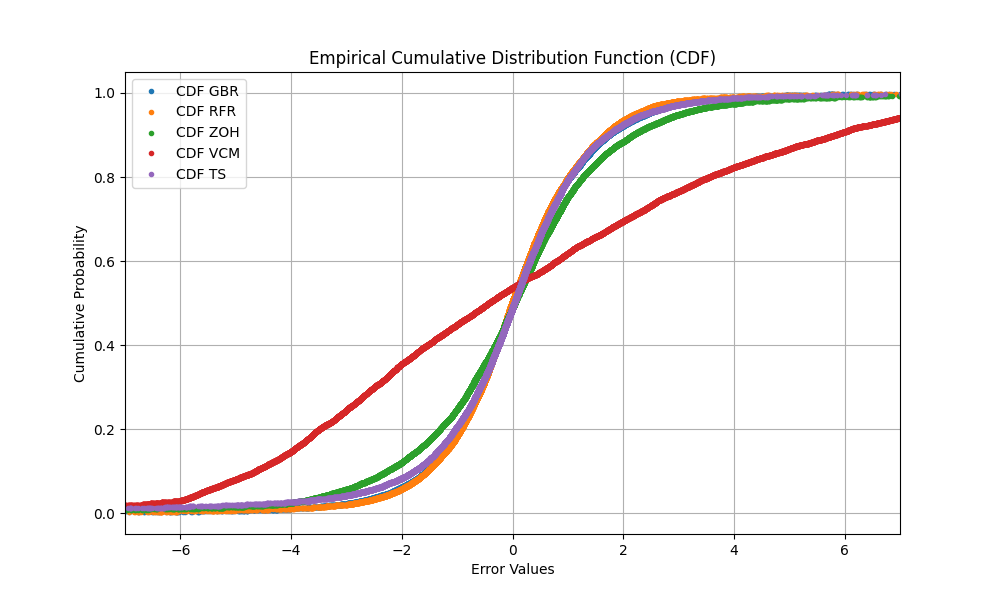

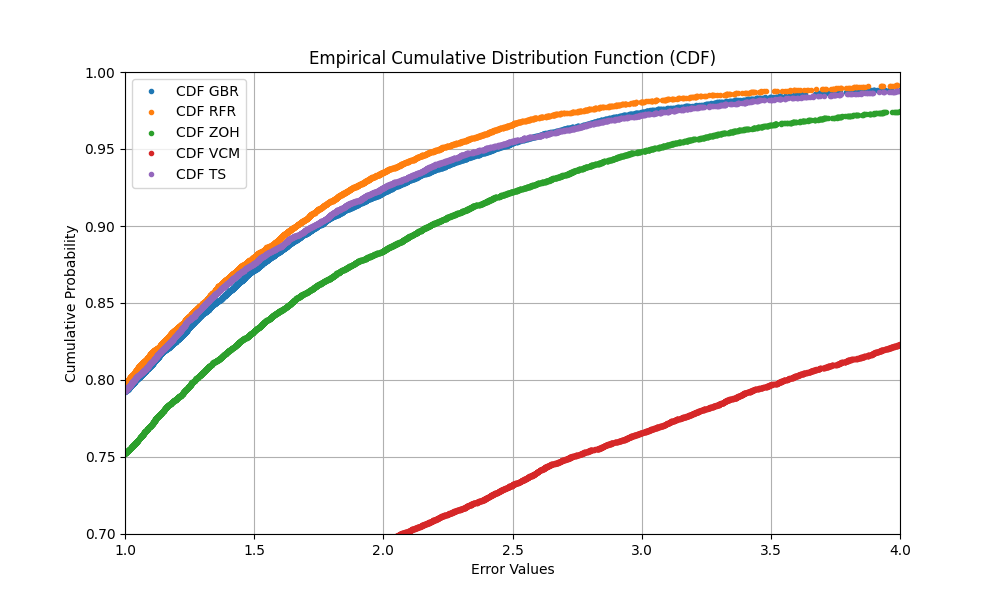

In [45]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt

# Configuration: Specify which models to include
models_to_run = {
    "GBR": True,
    "RFR": True,
    "LGB": False,
    "ZOH": True,
    "VCM": True,
    "TS": True,
    "LR": False,  # Added Linear Regression model
}

# Initialize error lists
errors = {
    "GBR": [],
    "RFR": [],
    "LGB": [],
    "ZOH": [],
    "VCM": [],
    "TS": [],
    "LR": [],  # Added error list for Linear Regression
}
sorted_errors = {
    "GBR": [],
    "RFR": [],
    "LGB": [],
    "ZOH": [],
    "VCM": [],
    "TS": [],
    "LR": [],  # Added error list for Linear Regression
}

# Calculate mean signal power
means = [np.mean(obj.clean_sig_abs) for obj in obj_act]
avg_power = np.mean(np.hstack(means))

# Evaluate models
for test_x_normalized, test_x, test_y, test_weights in zip(X_test_normalized, X_test, y_test, weights_test):
    if models_to_run["GBR"]:
        pred_y = gbr.predict(test_x_normalized)
        errors["GBR"].append(pred_y - test_y)
    if models_to_run["RFR"]:
        pred_y = rfr.predict(test_x_normalized)
        errors["RFR"].append(pred_y - test_y)
    if models_to_run["LGB"]:
        pred_y = lgb.predict(test_x_normalized)
        errors["LGB"].append(pred_y - test_y)
    if models_to_run["ZOH"]:
        pred_y = test_x[:, 6]  # the mean value of the last 20 points weighted
        errors["ZOH"].append(pred_y - test_y)
    if models_to_run["VCM"]:
        pred_y = avg_power * np.ones(len(test_y))  # VCM
        errors["VCM"].append(pred_y - test_y)
    if models_to_run["TS"]:
        pred_y = forecast_arima(np.diff(test_x[:, 12], 1), a=mean_AR_weights, data=test_x[:, 12], forecast_horizon=10, initial_value=test_x[0, 12])
        errors["TS"].append(pred_y - test_y)
    if models_to_run["LR"]:
        pred_y = lr.predict(test_x_normalized)
        errors["LR"].append(pred_y - test_y)

# Combine errors for selected models
for key in errors:
    if models_to_run[key]:
        errors[key] = np.hstack(errors[key])
        print(f"Mean error for {key}: {np.mean(errors[key])}")  # mean error adjustment
        # errors[key] = errors[key] - np.mean(errors[key])  # Center errors around zero

# Plot histograms for selected models
plt.figure(figsize=(10, 6))
for key in errors:
    if models_to_run[key]:
        plt.hist(errors[key], bins=100, alpha=0.5, label=key, density=True, cumulative=False, histtype='bar')
plt.legend()
plt.title('Error Histograms')
plt.xlabel('Error Values')
plt.xlim(-7, 7)
plt.ylabel('Density')
plt.show()
plt.grid()
plt.savefig('figures/histogram.pdf', dpi=225)

# Compute empirical CDF for selected models
cdf = {}
quantile_97_results = {}
for key in errors:
    if models_to_run[key]:
        sorted_errors[key] = np.sort(errors[key])
        cdf[key] = np.arange(1, len(errors[key]) + 1) / len(errors[key])
        median_error = np.median(sorted_errors[key])
        
        # Calculate the 97th quantile
        quantile_97 = np.percentile(sorted_errors[key], 97)  # 97th percentile
        quantile_97_results[key] = quantile_97

# Plot the CDFs for selected models
plt.figure(figsize=(10, 6))
for key in cdf:
    if models_to_run[key]:
        plt.plot(sorted_errors[key], cdf[key], label=f'CDF {key}', marker='.', linestyle='none')

plt.title('Empirical Cumulative Distribution Function (CDF)')
plt.xlabel('Error Values')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid()
plt.xlim(-7, 7)
plt.show()
plt.savefig('figures/CDF.png', dpi=225)
plt.ylim(0.7, 1)
plt.xlim(1, 4)
plt.show()
plt.savefig('figures/CDF_zoomed.png', dpi=225)


Reference value for MAE percentage: 20.9323

MSE Results for All Models:
GBR: 2.2688
RFR: 2.1545
ZOH: 4.5181
VCM: 16.4437
TS: 3.8174

MAE Results for All Models (Absolute):
GBR: 1.0620
RFR: 1.0292
ZOH: 1.4387
VCM: 3.2915
TS: 1.2149

MAEP Results for All Models (Percentage):
GBR: 5.71%
RFR: 5.51%
ZOH: 7.71%
VCM: 18.11%
TS: 6.41%
Average noise power: -144.75 dBm
Ground truth capacity (mean): 29032.9616


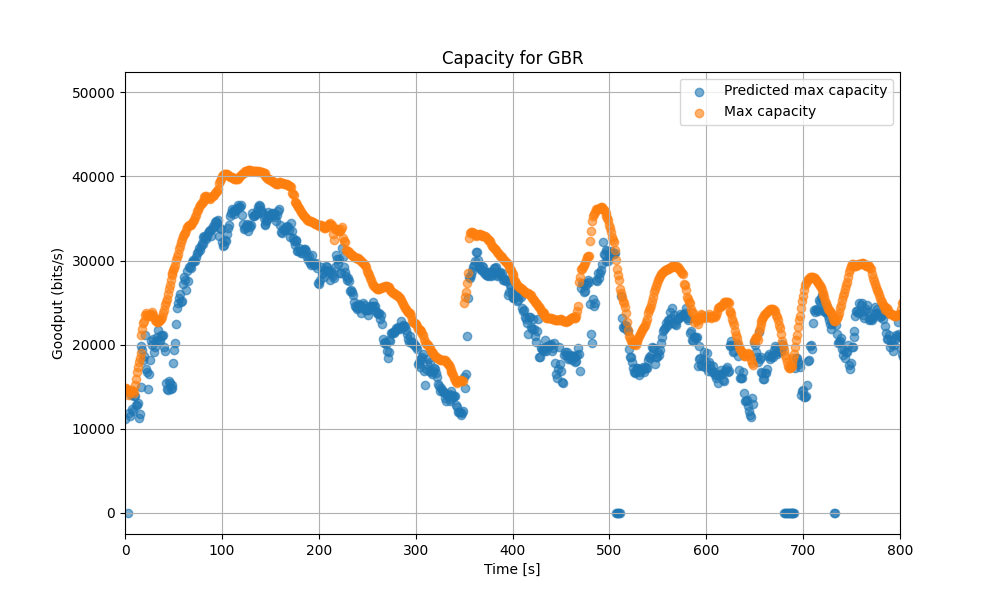

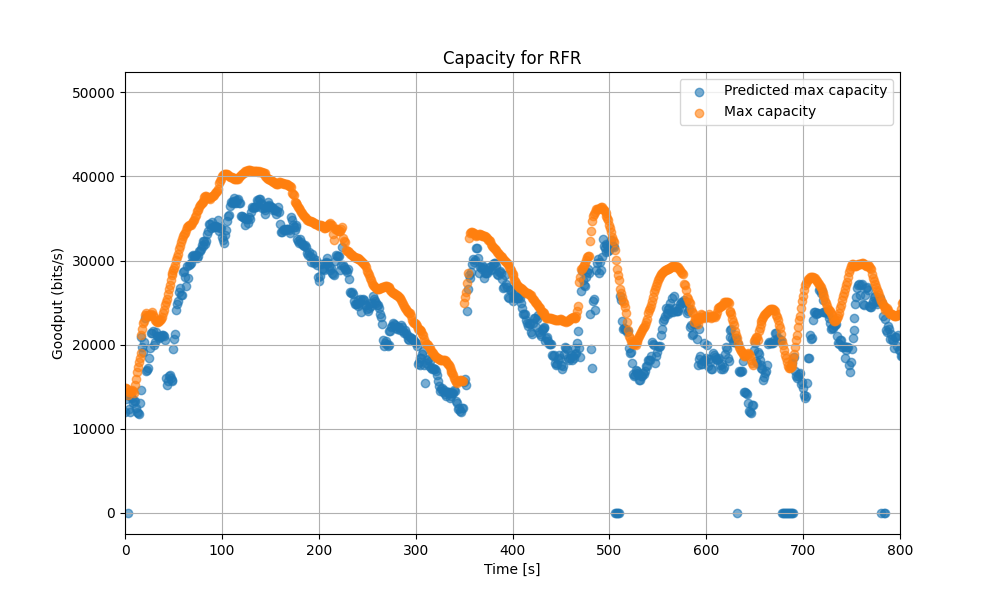

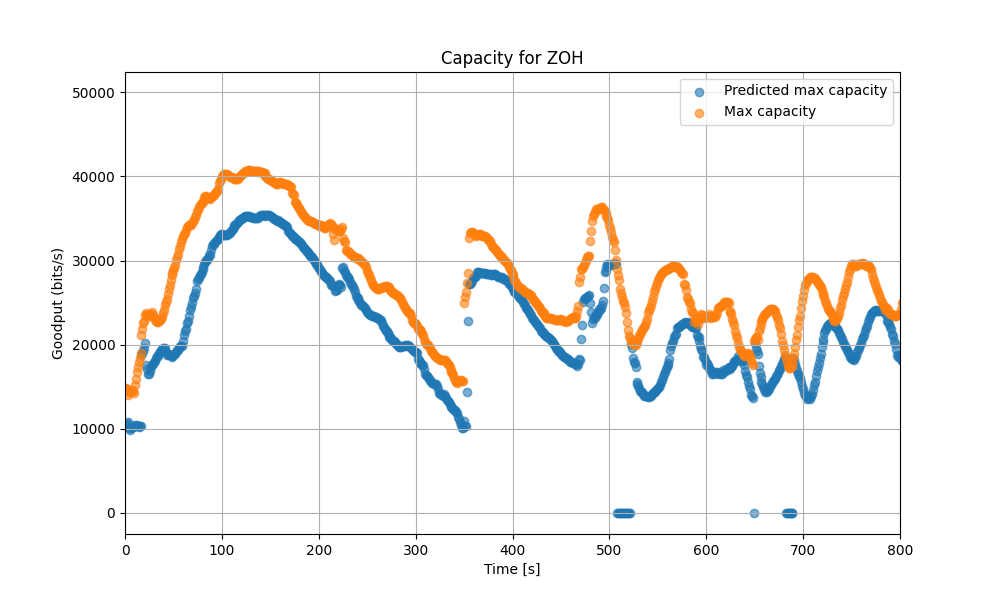

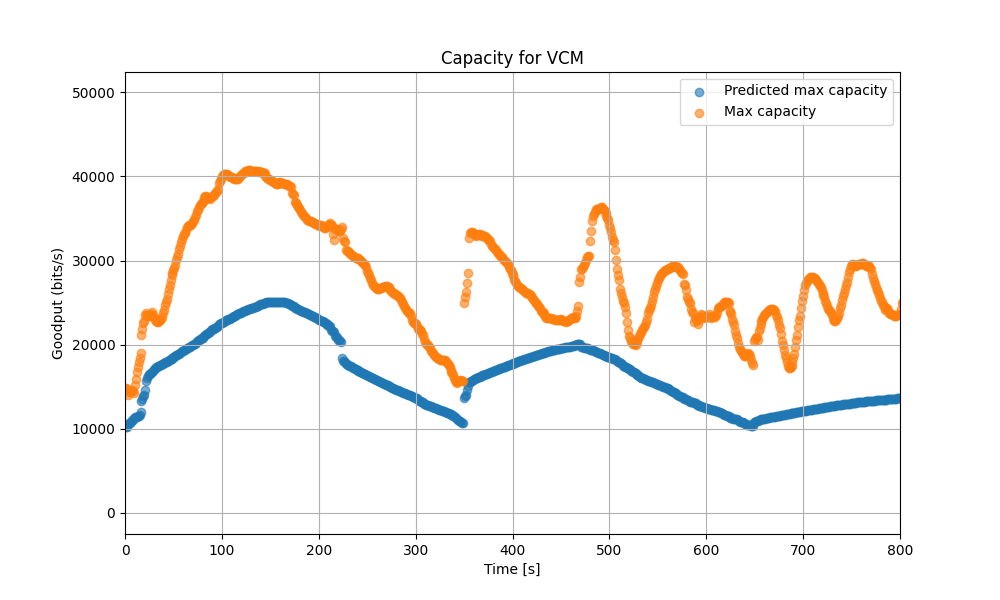

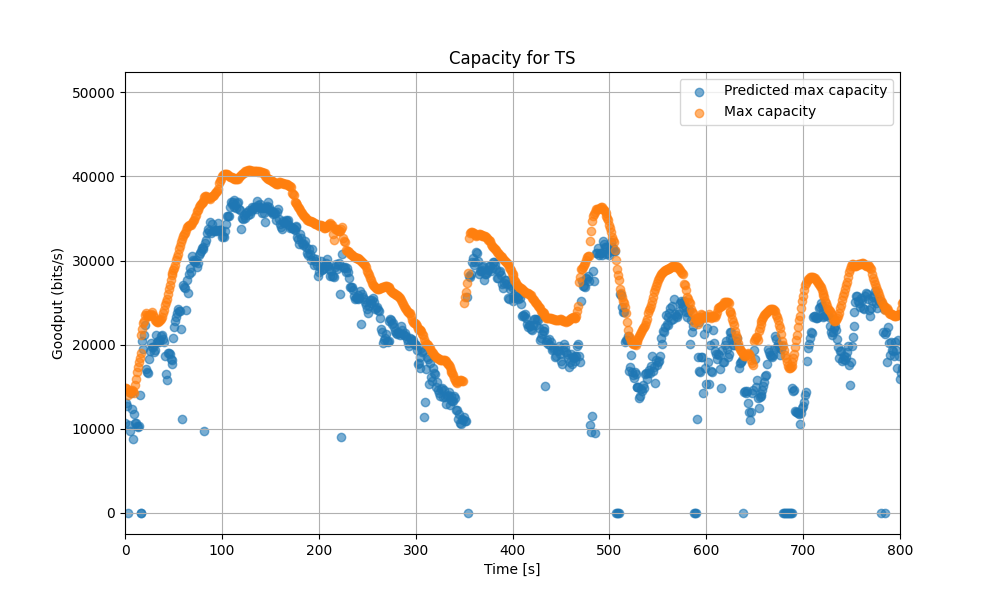


Capacity Results for All Models (Absolute):
GBR: 23983.5838
RFR: 24363.6939
ZOH: 22542.6521
VCM: 16126.4897
TS: 23634.3530

Capacity Results for All Models (Percentage of Ground Truth):
GBR: 82.61%
RFR: 83.92%
ZOH: 77.65%
VCM: 55.55%
TS: 81.41%
Ground truth capacity (mean): 29032.9616


In [46]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate MSE and MAE for each model across all passes
mse_results = {}
mae_results = {}
# mae_percentage = {}  # To store MAE as a percentage
capacity_percentage = {}  # To store capacity as a percentage
y_testlong=np.hstack(y_test)

# Assuming y_testlong is the ground truth for the target variable
reference_value_mae = np.mean(np.abs(y_testlong))  # Mean absolute value of ground truth
print(f"Reference value for MAE percentage: {reference_value_mae:.4f}")

for key in errors:
    if models_to_run[key]:
        # Calculate Mean Squared Error (MSE)
        squared_errors = errors[key] ** 2
        mse = np.mean(squared_errors)
        mse_results[key] = mse

        # Calculate Mean Absolute Error (MAE)
        mae = np.mean(np.abs(errors[key]))
        mae_results[key] = mae

        # Calculate MAE as a percentage of reference value
        # mae_percentage[key] = (mae / reference_value_mae) * 100

# Mean Absolute Error in Percentage (MAEP)
maep_results = {}

for key in errors:
    if models_to_run[key]:
        # Compute MAEP for each model
        relative_errors = np.abs(errors[key]) / np.abs(y_testlong)
        relative_errors[np.isinf(relative_errors)] = 0  # Handle division by zero for very small y_testlong
        maep_results[key] = np.mean(relative_errors) * 100  # Convert to percentage





# Display the MSE and MAE results
print("\nMSE Results for All Models:")
for model, mse in mse_results.items():
    print(f"{model}: {mse:.4f}")

print("\nMAE Results for All Models (Absolute):")
for model, mae in mae_results.items():
    print(f"{model}: {mae:.4f}")

# Display MAEP results
print("\nMAEP Results for All Models (Percentage):")
for model, maep in maep_results.items():
    print(f"{model}: {maep:.2f}%")

# Capacity calculations
Capacity = {}
B = 4800
noise_spectral_density = []

for obj in obj_act:
    noise_spectral_density.append(np.mean(obj.noise_obj.noise))

noise_spectral_density = np.mean(np.hstack(noise_spectral_density))
noise_power = 10 * np.log10(noise_spectral_density * B)
print(f"Average noise power: {noise_power:.2f} dBm")

signal_power = y_testlong + np.hstack([x[:, 3] for x in X_test])  # Extract FSPL and add to y_testlong
ground_truth_capacity = B * np.log2(1 + 10 ** ((signal_power - noise_power) / 10))  # Ground truth capacity
ground_truth_capacity_mean = np.mean(ground_truth_capacity)

print(f"Ground truth capacity (mean): {ground_truth_capacity_mean:.4f}")

mean_capacity = {}
for key in models_to_run:
    if models_to_run[key]:
        # Compute capacity with spectral efficiency adjustment
        Capacity[key] = B * np.log2(
            1 + 10 ** ((signal_power + (errors[key] - quantile_97_results[key]) - noise_power) / 10)
        )

        # Set capacity to 0 if error is positive
        Capacity[key][errors[key] - quantile_97_results[key] > 0] = 0

        # Calculate mean capacity and as percentage of ground truth
        mean_capacity[key] = np.mean(Capacity[key])
        capacity_percentage[key] = (mean_capacity[key] / ground_truth_capacity_mean) * 100

        # Plot the capacity
        plt.figure(figsize=(10, 6))
        plt.scatter(
            np.arange(0, len(y_testlong)),
            Capacity[key],
            label="Predicted max capacity",
            alpha=0.6,
        )
        plt.scatter(
            np.arange(0, len(y_testlong)),
            ground_truth_capacity,
            label="Max capacity",
            alpha=0.6,
        )
        plt.legend()
        plt.title(f"Capacity for {key}")
        plt.xlabel("Time [s]")
        plt.ylabel("Goodput (bits/s)")
        plt.xlim(0, 800)
        plt.grid()
        plt.savefig(f"figures/capacity_{key}.pdf")
        plt.show()

# Display capacity results
print("\nCapacity Results for All Models (Absolute):")
for model, mean in mean_capacity.items():
    print(f"{model}: {mean:.4f}")

print("\nCapacity Results for All Models (Percentage of Ground Truth):")
for model, percentage in capacity_percentage.items():
    print(f"{model}: {percentage:.2f}%")

print(f"Ground truth capacity (mean): {ground_truth_capacity_mean:.4f}")


# Deep learning
It requires the data to be managed in a different way. I will have to give the model a whole lot of 20 seconds of data for example, each with their own feature set. Here the slope and mean are not needed.

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# Example data (replace with your dataset)
# X = np.random.rand(1000, 10, 1)  # 1000 samples, 10 time steps, 1 feature
# y = np.random.rand(1000, 1)      # 1000 target values
# print(f"X shape: {X}")


# # Normalize features (important for neural networks)
# scaler = StandardScaler()
# X = scaler.fit_transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)
# print(f"X {X} ")


# Assuming train_X has 1000 data points and you want to use the last 10 seconds (timesteps = 10)
# Reshape train_X to be 3D: (samples, timesteps, features)
train_X = train_X.reshape((train_X.shape[0] - 10 + 1, 10, 12))  # Example: 1000 data points -> 990 samples
test_X = train_X.reshape((test_X.shape[0] - 10 + 1, 10, 12))
# Now train_X should have the shape (990, 10, 3), where:
# 990 samples, 10 timesteps, and 3 features per timestep.

# Create the RNN model for regression
model = Sequential()
model.add(SimpleRNN(units=50, activation='relu', input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))  # Output layer with 1 unit for regression

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(train_X, train_y, epochs=10, batch_size=32, validation_data=(test_X, test_y))


for val_x_normalized, val_x, val_y, val_weights in zip(X_val_normalized, X_val, y_val, weights_val):
    pred_y = model.predict(val_x_normalized)
    # Compute RMSE (Root Mean Squared Error)
    test_rmse = (mean_squared_error(val_y, pred_y,sample_weight=val_weights) ** (1 / 2)) #weighted RMSE

    # Print RMSE
    print(f'Root Mean Square Error: {test_rmse:.2f}')


    plt.figure(figsize=(10, 6))
    plt.scatter(val_x[:,5], val_y+val_x[:,3], label='Target',alpha=0.5)
    plt.scatter(val_x[:,5], pred_y+val_x[:,3], label='Predicted',alpha=0.5)
    plt.legend()
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted Values')
    plt.show()

X shape: [[[0.47563867]
  [0.0264186 ]
  [0.38860669]
  ...
  [0.69360099]
  [0.24342739]
  [0.8271379 ]]

 [[0.65410423]
  [0.09185389]
  [0.91212457]
  ...
  [0.83256372]
  [0.13984812]
  [0.69966111]]

 [[0.66165236]
  [0.31133837]
  [0.60591553]
  ...
  [0.94108906]
  [0.21095155]
  [0.37741783]]

 ...

 [[0.03415875]
  [0.26543158]
  [0.61756679]
  ...
  [0.24273139]
  [0.36826288]
  [0.75676672]]

 [[0.84407232]
  [0.6581939 ]
  [0.12254659]
  ...
  [0.79701827]
  [0.15944665]
  [0.48324729]]

 [[0.54490296]
  [0.11552298]
  [0.61664207]
  ...
  [0.3960816 ]
  [0.29333706]
  [0.61739743]]]
X [[[-0.08055337]
  [-1.62808164]
  [-0.38037178]
  ...
  [ 0.67030986]
  [-0.88050322]
  [ 1.13033413]]

 [[ 0.53424659]
  [-1.40266212]
  [ 1.42310661]
  ...
  [ 1.14902566]
  [-1.23732573]
  [ 0.69118651]]

 [[ 0.56024933]
  [-0.64655517]
  [ 0.36824026]
  ...
  [ 1.52288704]
  [-0.99237994]
  [-0.41891656]]

 ...

 [[-1.60141741]
  [-0.80470049]
  [ 0.40837796]
  ...
  [-0.88290089]
  [-0.4

ValueError: cannot reshape array of size 58452 into shape (4862,10,12)

# Import IQ samples to play around with

In [ ]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import noisy_moose as nm
import pickle
import os
from multiprocessing import Pool
import datetime

data_root = "C:/Users/StoreElberg/Aalborg Universitet/P7 - Link state - General/Data/satlab/"
data_file = "20241012T194350/VZLUSAT-2_20241012T202014"
obj_act=[]
my_pass = nm.prepping(data_root, data_file)
obj_act.append(my_pass)
obj_act[0].noise_obj.fft_size=32
obj_act[0].resolution= 0.01 #new attempt
# Calculate all local attributes:
obj_act[0].run()
# print(obj_act[0].filename) 
# obj_act[0].noise_obj.freqs

c:\Users\StoreElberg\AppData\Local\Programs\Python\Python311\Lib\site-packages\noisy_moose\preprocessing\prepping.py:121: RuntimeWarning: invalid value encountered in log10
  self.clean_sig = 10*np.log10(self.noise_obj.signal) - self.station_obj.fspl


In [ ]:
obj_act[0].station_obj.convert_timestamp()

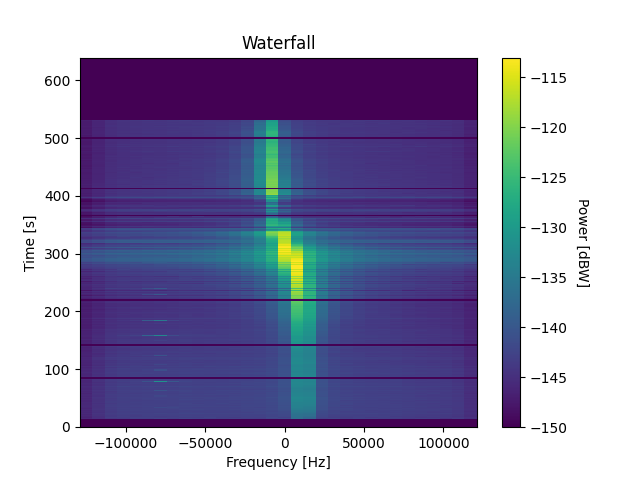

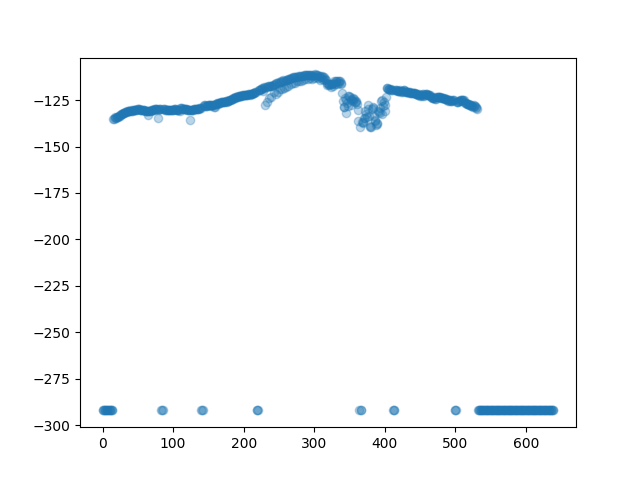

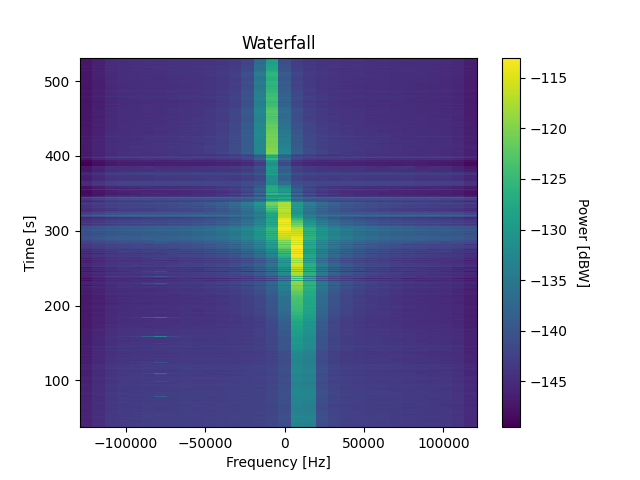

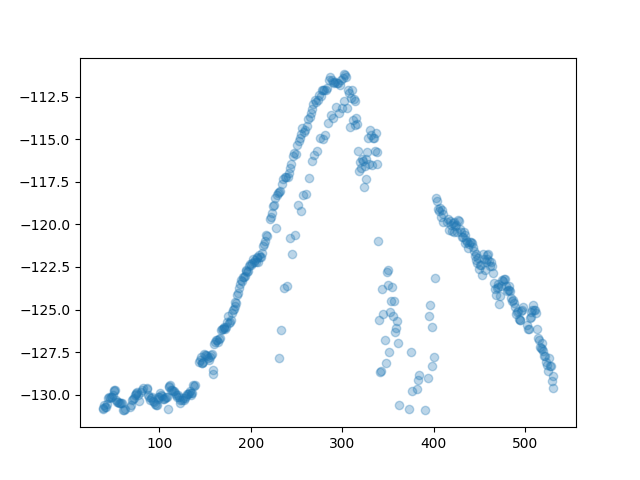

In [ ]:
plt.figure()
obj_act[0].noise_obj.plot_waterfall()
plt.show()
plt.figure()
plt.scatter(obj_act[0].time_ax,10*np.log10(obj_act[0].noise_obj.signal_abs),alpha=0.3)
plt.show()
obj2=obj_act[0][np.where(10*np.log10(obj_act[0].noise_obj.signal_abs)>-131)[0]]
plt.figure()
obj2.noise_obj.plot_waterfall()
plt.show()
plt.figure()
plt.scatter(obj2.time_ax,10*np.log10(obj2.noise_obj.signal_abs),alpha=0.3)
plt.show()

# Create features

C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_36004\1216263002.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  prediction_time = np.arange(int(obj_act[i].time_ax[0+20])+10, int(obj_act[i].time_ax[-1]) + 1, 1)  # Prediction time points from just after the 20 first point to the last point
C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_36004\1216263002.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  azi[q] =   obj_act[i].station_obj.azimuth[indices[0][-1]]
C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_36004\1216263002.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will erro

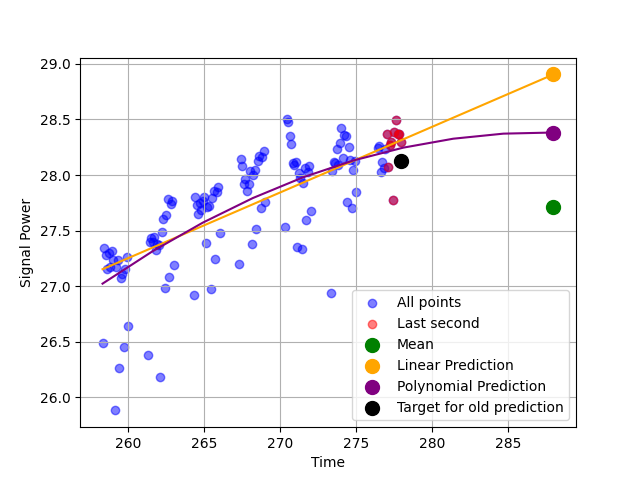

In [21]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler


def produce_dataset(obj_act, validation_split=0.1, pred_range=10):
    
    pred_range = int(pred_range)  # Prediction range in seconds must be an integer.
    # Initialize lists for features (X) and targets (y)
    X = []
    y = []

    X_val=[]
    y_val=[]

    importance = []
    importance_val = []
    # validation_split=0.1 # 20 percent for validation
    n_train_test_sets=int(len(obj_act)*(1-validation_split))+1
    n_validation_sets=len(obj_act)-int(len(obj_act)*(1-validation_split))-1
    # print(f"train/test sets = {int(len(obj_act)*(1-validation_split))+1}"+f", validation sets = {len(obj_act)-int(len(obj_act)*(1-validation_split))-1}")

    for i in range(len(obj_act)):
        prediction_time = np.arange(int(obj_act[i].time_ax[0+20])+10, int(obj_act[i].time_ax[-1]) + 1, 1)  # Prediction time points from just after the 20 first point to the last point

        # Initialize arrays for linear regression
        n_points_fit = np.zeros((len(prediction_time)))
        n_points = np.zeros((len(prediction_time)-pred_range))
        # coef = np.zeros((len(prediction_time)))
        # intercept = np.zeros((len(prediction_time)))
        slope_val = np.zeros((len(prediction_time)))
        mean = np.zeros((len(prediction_time)))
        mse_slope = np.zeros((len(prediction_time)))

        # Initialize arrays for polynomial regression
        # poly_coef = np.zeros((len(prediction_time), 3))  # Storing 3 coefficients for the 2nd-degree polynomial
        poly_val = np.zeros((len(prediction_time)))      # Predicted values for the polynomial
        mse_poly = np.zeros((len(prediction_time)))

        #all the classic sheit
        azi = np.zeros((len(prediction_time)))
        ele = np.zeros((len(prediction_time)))
        pe = np.zeros((len(prediction_time)))
        fspl = np.zeros((len(prediction_time)))
        noise = np.zeros((len(prediction_time)))
        x_time = np.zeros((len(prediction_time)))
        target = np.zeros((len(prediction_time)-pred_range))
        measurement= np.zeros((len(prediction_time)))

        # print(f"Prediction time: {prediction_time}")

        for q, time in enumerate(prediction_time[272:273]):  # only show the fucker for the first 3 predictions
            # Ensure time_ax is a numpy array
            time_ax = np.asarray(obj_act[i].time_ax)
            
            # Get indices for the specified range
            indices = np.where((time_ax > time - (20+pred_range)) & (time_ax < time - pred_range)) #20 seconds before the prediction time
            n_points_fit[q] = indices[0].size
            


            last_second_indices = np.where((time_ax > time - (1+pred_range)) & (time_ax < time-pred_range)) # last second before the prediction time
            # print(f"Indices len: {n_points_fit[q]}")
            if last_second_indices[0].size == 0:
                pass
            else:
                x_lin = np.array(obj_act[i].time_ax[indices[0]]).reshape(-1, 1)  # Reshape for sklearn
                y_lin = np.array(obj_act[i].clean_sig_abs[indices[0]])  # Dependent variable (target)            
                
                # Compute weights: closer to `time` has higher weight
                distances = np.abs(x_lin.flatten() - time)  # Distance from current `time`
                weights = np.exp(-distances / 10)  # Exponential decay (adjust scale as needed)

                mean[q] = np.mean(y_lin)

                #All the classic sheit
                azi[q] =   obj_act[i].station_obj.azimuth[indices[0][-1]]
                ele[q] =   obj_act[i].station_obj.elevation[indices[0][-1]]
                pe[q] =    np.mean(10*np.log10(obj_act[i].pointing_error[indices[0]])*weights)
                fspl[q] =  obj_act[i].station_obj.fspl[indices[0][-1]]
                noise[q] = np.mean(np.log10(obj_act[i].noise_obj.noise[last_second_indices[0]]))
                x_time[q] = obj_act[i].time_ax[indices[0][-1]]
                measurement[q]= np.mean(obj_act[i].clean_sig_abs[last_second_indices[0]])

                if q>=pred_range:
                    target[q-pred_range] = np.mean(obj_act[i].target[last_second_indices[0]]) #saving the target of the prediction
                    n_points[q-pred_range] = np.where((time_ax > time - (1+pred_range)) & (time_ax < time - pred_range))[0].size #How many points are the one second of the prediction time means how important each point is

                if indices[0].size > 10: #choose how many samples are needed for the regression to be valid
                    # --- Linear Regression ---
                    model = LinearRegression()
                    model.fit(x_lin, y_lin, sample_weight=weights)
                    
                    # Save model outputs
                    slope_val[q] = model.coef_[0] * (time) + model.intercept_
                    y_pred = model.predict(x_lin)
                    mse_slope[q] = mean_squared_error(y_lin, y_pred)

                    # Polynomial Regression
                    x_lin_flat = x_lin.flatten()  # Flatten for numpy.polyfit
                    poly = np.polyfit(x_lin_flat, y_lin, 2, w=weights)  # 2nd-degree polynomial with weights

                    # Polynomial prediction for the same points
                    poly_pred = np.polyval(poly, x_lin_flat)
                    poly_val[q] = np.polyval(poly, time)  # Prediction at (time + pred_range)
                    mse_poly[q] = mean_squared_error(y_lin, poly_pred)
                else:
                    slope_val[q] = np.mean(y_lin) #If there are not enough samples, just take the mean
                    poly_val[q] = np.mean(y_lin) #If there are not enough samples, just take the mean
                plt.figure()
                plt.scatter(x_lin, y_lin, label='All points', alpha=0.5, color='blue')
                plt.scatter(obj_act[i].time_ax[last_second_indices[0]], obj_act[i].clean_sig_abs[last_second_indices[0]], label='Last second',alpha=0.5,color='red')
                # plt.scatter(np.mean(x_lin),mean[q],s=100, label='Mean',color='green')
                plt.scatter(time,mean[q],s=100, label='Mean',color='green')
                plt.scatter(time, slope_val[q], label='Linear Prediction', s=100,color='orange')
                plt.plot(np.linspace(x_lin[0], time ,10), model.coef_[0] * (np.linspace(x_lin[0],time,10)) + model.intercept_, color='orange')
                plt.scatter(time, poly_val[q], label='Polynomial Prediction', s=100, color='purple')
                plt.plot(np.linspace(x_lin[0], time, 10), np.polyval(poly, np.linspace(x_lin[0], time, 10)), color='purple')
                plt.scatter(time-pred_range, np.mean(obj_act[i].target[last_second_indices[0]]), label='Target for old prediction', s=100, color='black')
                plt.xlabel('Time')
                plt.ylabel('Signal Power')
                plt.grid()
                plt.legend()
                plt.show()
                plt.savefig('many_points.png', dpi=225)
                
                    


                

        features = np.stack([
            azi   ,
            ele   ,
            pe    ,
            fspl  ,
            noise ,
            x_time,
            mean,
            slope_val,
            mse_slope,
            poly_val,
            mse_poly,
            n_points_fit,
            measurement
        ], axis=1)

        x_time=x_time[:-pred_range]
        # Slice the array, ensuring that it remains 2D
        valid_indices = np.where((n_points > 0) & (target > 0) & (x_time > 0))[0] # delete all the targets that have less than 1 points and if target is 0, as they are NOT important
        # print(f"Valid indices: {valid_indices}")
        features = features[valid_indices,:] 
        target = target[valid_indices] 
        n_points = n_points[valid_indices]


        if i < len(obj_act)*(1-validation_split):
            X.append(features)
            y.append(target)
            importance.append(n_points)
        else:
            X_val.append(features)
            y_val.append(target)
            importance_val.append(n_points)    

    # X = np.vstack(X)
    # y = np.hstack(y)
    # X = np.squeeze(X)
    # print(f"X shape: {X.shape}")

    # scaler = StandardScaler()
    
    # Convert to NumPy arrays for input to the model
    # y = np.array(y)
    # print(f"importance_val_normalized shape: {len(importance_val_normalized)}")

    return X, y, X_val, y_val, n_train_test_sets, n_validation_sets, importance, importance_val

X, Y, X_val, y_val, n_train_test_sets, n_validation_sets, weights, weights_val = produce_dataset(obj_act[:1], validation_split = 0.2 ,pred_range = 10)



# Remove outliers based on doppler shift
Maybe still psykopat relevant

C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_15500\484626010.py:31: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  valid_min = int(center_bin - (valid_range_bins // 2))
C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_15500\484626010.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  valid_max = int(center_bin + (valid_range_bins // 2)) + 1 # +1 to include the last bin


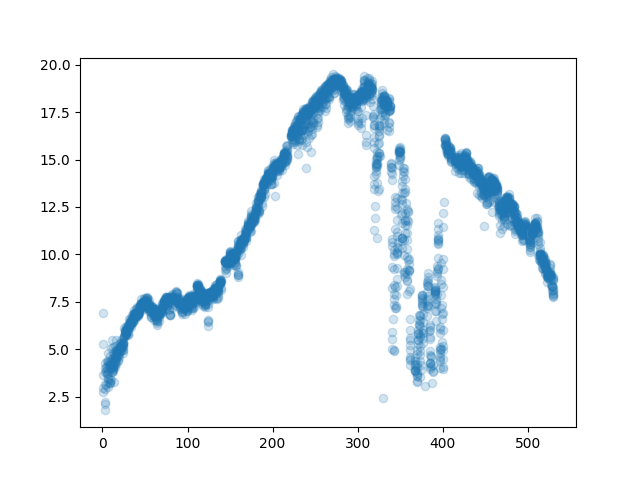

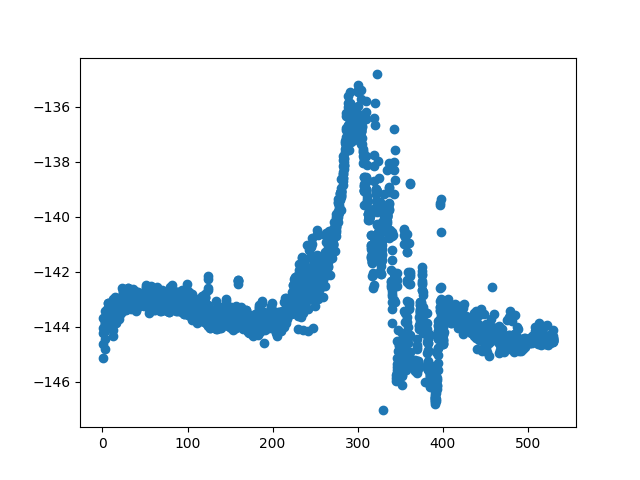

outlier_indices [1, 2, 3, 7, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 2

In [ ]:
%matplotlib widget
def remove_outlier(obj):
    outlier_indices = []
    # valid_range_bins = int(2 * 11e3 / (250e3 / obj.noise_obj.fft_size))  # Total valid bins for the maximum doppler shift of Â±11kHz when sampling rate is 250kHz
    signal_bandwidth =15e3 #evaluated from fft
    # print(f"Filled bins {np.round(signal_bandwidth/(250e3/obj.noise_obj.fft_size))}")
    valid_range_bins=np.round(signal_bandwidth/(250e3/obj.noise_obj.fft_size))
    
    sp=np.zeros(len(obj.noise_obj.waterfall))
    noipow=np.zeros(len(obj.noise_obj.waterfall))
    #initialise speed
    speed=(obj.station_obj.dist[1]-obj.station_obj.dist[0])/(obj.time_ax[1]-obj.time_ax[0])

    for i , row in enumerate(obj.noise_obj.waterfall):
        if i !=0:
            speed = (obj.station_obj.dist[i]-obj.station_obj.dist[i-1])/(obj.time_ax[i]-obj.time_ax[i-1])
            # print(f"startspeed {startspeed}")

        dopplershift=-((speed)/3e8)*obj.station_obj._freq
        # print(f"Doppler shift {dopplershift}")
        center_bin = np.round(obj.noise_obj.fft_size/2) + np.round((dopplershift) / (250e3 / obj.noise_obj.fft_size)) # center freq is the 17th index.
        # print(f"center freq {center_bin}")


        fft_data =  10*np.log10(np.squeeze(row))  # FFT data (magnitude spectrum)
        # center_bin = obj.noise_obj.fft_size // 2  # Center bin of the FFT, integer division to get an actual number

        # Determine valid bin range for Doppler effect
        valid_min = int(center_bin - (valid_range_bins // 2))
        valid_max = int(center_bin + (valid_range_bins // 2)) + 1 # +1 to include the last bin
        # print(f"valid min {valid_min} valid max {valid_max}")

        # Extract FFT values in the valid range
        valid_fft_values = fft_data[valid_min:valid_max]
        invalid_fft_values = np.concatenate((fft_data[:valid_min], fft_data[valid_max:]))
        # Find the maximum value in the valid range
        signal_power = np.mean(valid_fft_values)
        noise_power=np.mean(invalid_fft_values)
        sp[i]=signal_power
        noipow[i]=noise_power

        # plt.figure()
        # plt.scatter(obj.noise_obj.freqs[valid_min:valid_max],valid_fft_values,label="Signal power to noise power")
        # plt.scatter(np.concatenate((obj.noise_obj.freqs[:valid_min], obj.noise_obj.freqs[valid_max:])),invalid_fft_values,label="Signal power to noise power")
        # plt.show()

        if (signal_power-noise_power>3):
            outlier_indices.append(i) #If the peak is gucci, then we keep it
        
    
    plt.figure()
    plt.scatter(obj.time_ax,sp-noipow,label="Signal power to noise power",alpha=0.2)
    plt.show()
    plt.figure()
    plt.scatter(obj.time_ax,noipow,label="Noise power")
    # plt.scatter(obj.time_ax,sp-noipow,label="Signal power to noise power")
    plt.show()

    print(f"outlier_indices {outlier_indices}")
    return obj[outlier_indices]#Basically deleting all the points where it was not transmitting



# obj_act[0].station_obj.convert_timestamp() #converts the timestamps for the station object to numpy array
    
# idx = np.argwhere(10*np.log10(obj_act[0].noise_obj.signal_abs) > -138) #Threshold set to -138 dBm
# # water_obj_act[i].noise_obj.waterfall=water_obj_act[i].noise_obj.waterfall[idx]

# obj_act[0]=obj_act[0][idx] #Basically deleting all the points where the moving average is below the threshold

obj_act[0]=remove_outlier(obj_act[0]) #Removing the outliers


Length of list 2


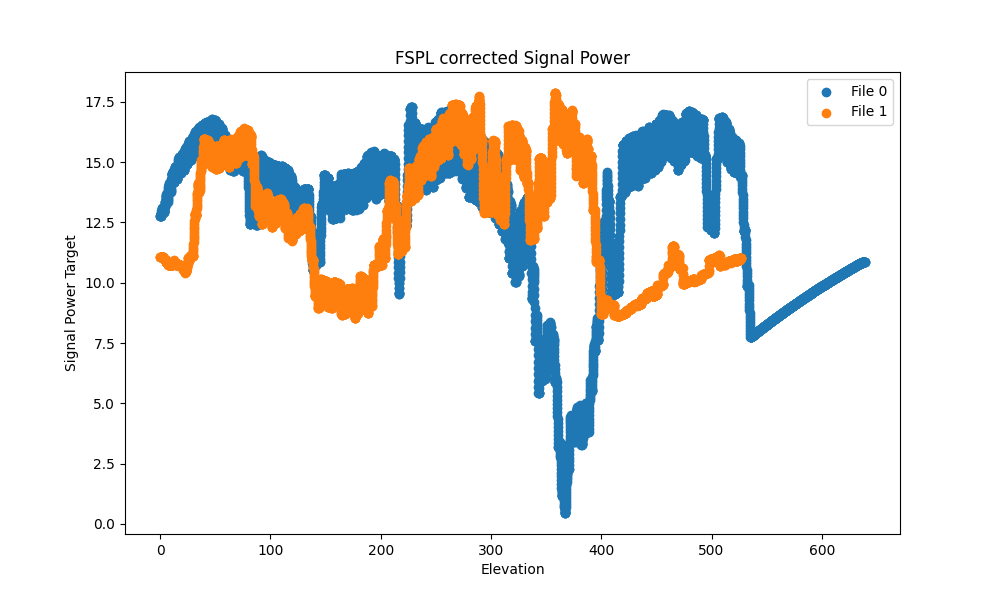

In [61]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import noisy_moose as nm
import pickle
import os
from multiprocessing import Pool
import datetime

data_files_active = os.listdir("../output/VZLUSAT/water/")

vzlusat_active = list(i for i in data_files_active if "VZLUSAT-2" in i)


obj_act: list[nm.prepping] = [] #: list[nm.prepping] = [] means that the variable is a list of nm.prepping objects, which makes it possible to autocomplete the methods and attributes of the nm.prepping class.C:\Users\StoreElberg\OneDrive - Aalborg Universitet\Git3\output\VZLUSAT

for i in vzlusat_active[:2]: #choose how many to load
    with open("../output/VZLUSAT/water/" + i, 'rb') as f:
        obj_act.append(pickle.loads(f.read()))

# pointing error calculation
def calculate_pointing_error(set_azimuth, set_elevation, azimuth, elevation):
    """
    Calculate the pointing error given reference (set) and measured azimuth and elevation.
    
    Parameters:
        set_azimuth (array-like): Reference azimuth values in degrees.
        set_elevation (array-like): Reference elevation values in degrees.
        azimuth (array-like): Measured azimuth values in degrees.
        elevation (array-like): Measured elevation values in degrees.
    
    Returns:
        np.ndarray: Pointing error for each pair of reference and measured angles in degrees.
    """
    # Convert degrees to radians
    set_azimuth_rad = np.radians(set_azimuth)
    set_elevation_rad = np.radians(set_elevation)
    azimuth_rad = np.radians(azimuth)
    elevation_rad = np.radians(elevation)
    
    # Compute the pointing error using the great-circle distance formula
    pointing_error_rad = np.arccos(
        np.sin(set_elevation_rad) * np.sin(elevation_rad) +
        np.cos(set_elevation_rad) * np.cos(elevation_rad) * np.cos(azimuth_rad - set_azimuth_rad)
    )
    
    # Convert the pointing error back to degrees
    pointing_error_deg = np.degrees(pointing_error_rad)
    return pointing_error_deg

def remove_outlier(obj): # still a good idea that could be implemented in real time, but less important as it is already being done on the dataset
    outlier_indices = []
    valid_range_bins = int(2 * 11e3 / (250e3 / obj.noise_obj.fft_size))  # Total valid bins for the maximum doppler shift of ±11kHz when sampling rate is 250kHz
    for i , row in enumerate(obj.noise_obj.waterfall):
        fft_data =  10*np.log10(np.squeeze(row))  # FFT data (magnitude spectrum)
        center_bin = obj.noise_obj.fft_size // 2  # Center bin of the FFT, integer division to get an actual number

        # Determine valid bin range for Doppler effect
        valid_min = max(0, center_bin - valid_range_bins // 2)
        valid_max = min(obj.noise_obj.fft_size, center_bin + valid_range_bins // 2)

        # Extract FFT values in the valid range
        valid_fft_values = fft_data[valid_min:valid_max]

        # Find the maximum value in the valid range
        peak_value = np.max(valid_fft_values)


        if (peak_value-np.mean(fft_data)>5):
            outlier_indices.append(i) #If the peak is gucci, then we keep it

    return obj[outlier_indices]#Basically deleting all the points where it was not transmitting



print(f"Length of list {len(obj_act)}")

for i in range(len(obj_act)):
    #first outlier removal using threshold
    # idx = np.argwhere(10*np.log10(obj_act[i].noise_obj.signal_abs) > -138).flatten() #Threshold set to -138 dBm on the data without the FSPL correction
    # obj_act[i]=obj_act[i][idx] #Basically deleting all the points where the moving average is below the threshold
    idx = np.argwhere(10*np.log10(obj_act[i].noise_obj.signal_abs) < -158).flatten() 
    # print(f"idx {idx}")
    # print(f"obj_act[i] {obj_act[i].clean_sig_abs[idx]}")
    obj_act[i].clean_sig_abs[idx]=obj_act[i].clean_sig_abs[idx] +150 #Basically deleting all the points where the moving average is below the threshold
    # print(f"obj_act[i] {obj_act[i].clean_sig_abs[idx]}")
    # print(f"obj_act[i] {obj_act[i][idx]}")
    #second outlier removal using peak detection
    # obj_act[i]=remove_outlier(obj_act[i])

    # Calculate the target values
    clean_sig_abs = np.squeeze(obj_act[i].clean_sig_abs)
    window_size = 99   #
    padded_signal = np.pad(clean_sig_abs, pad_width=window_size // 2, mode='reflect')
    moving_avg = np.convolve(padded_signal, np.ones(window_size) / window_size, mode='valid')
    time_ax_avg = obj_act[i].time_ax[:len(moving_avg)]

    # squared_errors = (clean_sig_abs - moving_avg) ** 2  # Compute squared errors

    # removing outliers
    # obj_act[i]=obj_act[i][np.where(squared_errors < 10 )[0]]

    # obj_act[i]=obj #delimit the object
    # obj_act[i].target = moving_avg[np.where(squared_errors < 10 )[0]]
    obj_act[i].target = moving_avg
    # Calculate pointing error for this object
    pointing_error = calculate_pointing_error(
        set_azimuth=obj_act[i].station_obj.set_azimuth,
        set_elevation=obj_act[i].station_obj.set_elevation,
        azimuth=obj_act[i].station_obj.azimuth,
        elevation=obj_act[i].station_obj.elevation
    )
    # Append the pointing error as a new attribute to the object
    obj_act[i].pointing_error = pointing_error
    
# Plot the first feature (e.g., signal power) for some files
plt.figure(figsize=(10, 6))
for i in range(len(obj_act)):
    plt.scatter(obj_act[i].time_ax,obj_act[i].target, label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Elevation')
plt.ylabel('Signal Power Target')
plt.title('FSPL corrected Signal Power')
plt.legend()
plt.show()


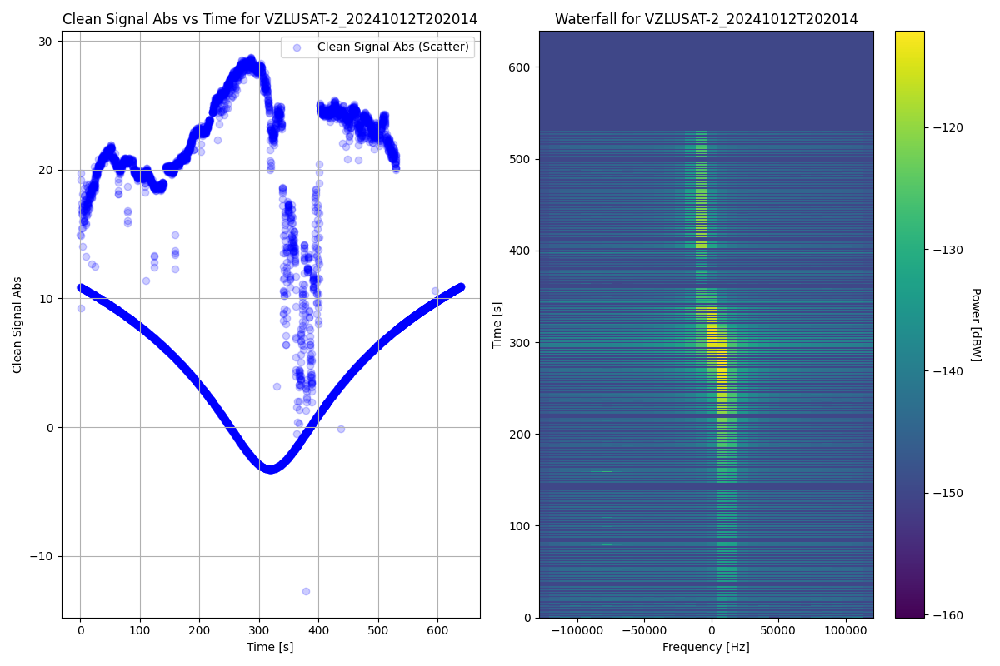

In [63]:
# for i in range(len(obj_act)):
for i in range(1):
    n=obj_act[i]
    
    for t in range(1):
        # Ensure clean_sig_abs is 1D
        clean_sig_abs = np.squeeze(n.clean_sig_abs)
        window_size = 199   #
        padded_signal = np.pad(clean_sig_abs, pad_width=window_size // 2, mode='reflect')
        moving_avg = np.convolve(padded_signal, np.ones(window_size) / window_size, mode='valid')
        time_ax_avg = obj_act[i].time_ax[:len(moving_avg)]


        # Create the figure and subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 8))  # 1 row, 2 columns

        # Plot the clean signal and moving average in the first subplot
        axes[0].scatter(n.time_ax, clean_sig_abs, label='Clean Signal Abs (Scatter)', color='blue', alpha=0.2)
        # axes[0].plot(time_ax_avg, moving_avg, label=f'Moving Avg (Window={window_size})', color='red', linewidth=2)
        axes[0].set_xlabel('Time [s]')
        axes[0].set_ylabel('Clean Signal Abs')
        axes[0].set_title(f'Clean Signal Abs vs Time for {n.filename}')
        axes[0].legend()
        axes[0].grid(True)

        # Plot the waterfall in the second subplot
        power_log = 10 * np.log10(n.noise_obj.waterfall)
        power_log = np.squeeze(power_log)
        pcol = axes[1].pcolormesh(n.noise_obj.freqs, n.time_ax, power_log, shading='auto', cmap='viridis')
        cbar = fig.colorbar(pcol, ax=axes[1], orientation='vertical')
        cbar.ax.get_yaxis().labelpad = 15
        cbar.ax.set_ylabel("Power [dBW]", rotation=270)

        axes[1].set_title("Waterfall for " + n.filename)
        axes[1].set_xlabel("Frequency [Hz]")
        axes[1].set_ylabel("Time [s]")

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()
        plt.savefig('New_data_with_noise.png', dpi=225)           # Save as png


        # squared_errors = (clean_sig_abs - moving_avg) ** 2  # Compute squared errors

        # plt.figure(figsize=(10, 6))
        # plt.scatter(n.time_ax, squared_errors, label='Squared Errors', color='red', alpha=0.2)
        # plt.xlabel('Time [s]')
        # plt.ylabel('Squared Error')
        # plt.title('Squared Errors vs Time')
        # plt.legend()
        # plt.grid(True)
        # plt.show()
        


        # # removing outliers
        # n=n[np.where(squared_errors<25-(t*4))[0]]
    


# making plots

Length of list 2


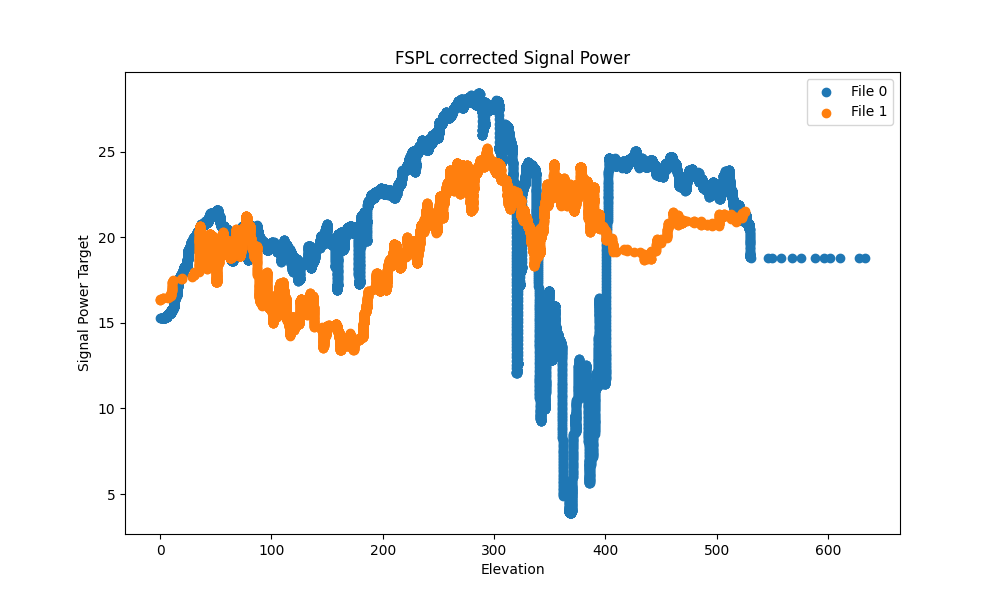

In [65]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import noisy_moose as nm
import pickle
import os
from multiprocessing import Pool
import datetime

data_files_active = os.listdir("../output/waterfall/active/")

vzlusat_active = list(i for i in data_files_active if "VZLUSAT-2" in i)


obj_act: list[nm.prepping] = [] #: list[nm.prepping] = [] means that the variable is a list of nm.prepping objects, which makes it possible to autocomplete the methods and attributes of the nm.prepping class.C:\Users\StoreElberg\OneDrive - Aalborg Universitet\Git3\output\VZLUSAT

for i in vzlusat_active[:2]: #choose how many to load
    with open("../output/waterfall/active/" + i, 'rb') as f:
        obj_act.append(pickle.loads(f.read()))

# pointing error calculation
def calculate_pointing_error(set_azimuth, set_elevation, azimuth, elevation):
    """
    Calculate the pointing error given reference (set) and measured azimuth and elevation.
    
    Parameters:
        set_azimuth (array-like): Reference azimuth values in degrees.
        set_elevation (array-like): Reference elevation values in degrees.
        azimuth (array-like): Measured azimuth values in degrees.
        elevation (array-like): Measured elevation values in degrees.
    
    Returns:
        np.ndarray: Pointing error for each pair of reference and measured angles in degrees.
    """
    # Convert degrees to radians
    set_azimuth_rad = np.radians(set_azimuth)
    set_elevation_rad = np.radians(set_elevation)
    azimuth_rad = np.radians(azimuth)
    elevation_rad = np.radians(elevation)
    
    # Compute the pointing error using the great-circle distance formula
    pointing_error_rad = np.arccos(
        np.sin(set_elevation_rad) * np.sin(elevation_rad) +
        np.cos(set_elevation_rad) * np.cos(elevation_rad) * np.cos(azimuth_rad - set_azimuth_rad)
    )
    
    # Convert the pointing error back to degrees
    pointing_error_deg = np.degrees(pointing_error_rad)
    return pointing_error_deg

def remove_outlier(obj): # still a good idea that could be implemented in real time, but less important as it is already being done on the dataset
    outlier_indices = []
    valid_range_bins = int(2 * 11e3 / (250e3 / obj.noise_obj.fft_size))  # Total valid bins for the maximum doppler shift of ±11kHz when sampling rate is 250kHz
    for i , row in enumerate(obj.noise_obj.waterfall):
        fft_data =  10*np.log10(np.squeeze(row))  # FFT data (magnitude spectrum)
        center_bin = obj.noise_obj.fft_size // 2  # Center bin of the FFT, integer division to get an actual number

        # Determine valid bin range for Doppler effect
        valid_min = max(0, center_bin - valid_range_bins // 2)
        valid_max = min(obj.noise_obj.fft_size, center_bin + valid_range_bins // 2)

        # Extract FFT values in the valid range
        valid_fft_values = fft_data[valid_min:valid_max]

        # Find the maximum value in the valid range
        peak_value = np.max(valid_fft_values)


        if (peak_value-np.mean(fft_data)>5):
            outlier_indices.append(i) #If the peak is gucci, then we keep it

    return obj[outlier_indices]#Basically deleting all the points where it was not transmitting



print(f"Length of list {len(obj_act)}")

for i in range(len(obj_act)):
    # first outlier removal using threshold
    idx = np.argwhere(10*np.log10(obj_act[i].noise_obj.signal_abs) > -138).flatten() #Threshold set to -138 dBm on the data without the FSPL correction
    
    obj_act[i]=obj_act[i][idx] #Basically deleting all the points where the moving average is below the threshold
    # print(f"idx {idx}")
    # print(f"obj_act[i] {obj_act[i].clean_sig_abs[idx]}")
    # obj_act[i].clean_sig_abs[idx] = 0 #Basically deleting all the points where the moving average is below the threshold
    # print(f"obj_act[i] {obj_act[i].clean_sig_abs[idx]}")
    # print(f"obj_act[i] {obj_act[i][idx]}")
    #second outlier removal using peak detection
    # obj_act[i]=remove_outlier(obj_act[i])

    # Calculate the target values
    clean_sig_abs = np.squeeze(obj_act[i].clean_sig_abs)
    window_size = 99   #
    padded_signal = np.pad(clean_sig_abs, pad_width=window_size // 2, mode='reflect')
    moving_avg = np.convolve(padded_signal, np.ones(window_size) / window_size, mode='valid')
    time_ax_avg = obj_act[i].time_ax[:len(moving_avg)]

    # squared_errors = (clean_sig_abs - moving_avg) ** 2  # Compute squared errors

    # removing outliers
    # obj_act[i]=obj_act[i][np.where(squared_errors < 10 )[0]]

    # obj_act[i]=obj #delimit the object
    # obj_act[i].target = moving_avg[np.where(squared_errors < 10 )[0]]
    obj_act[i].target = moving_avg
    # Calculate pointing error for this object
    pointing_error = calculate_pointing_error(
        set_azimuth=obj_act[i].station_obj.set_azimuth,
        set_elevation=obj_act[i].station_obj.set_elevation,
        azimuth=obj_act[i].station_obj.azimuth,
        elevation=obj_act[i].station_obj.elevation
    )
    # Append the pointing error as a new attribute to the object
    obj_act[i].pointing_error = pointing_error
    
# Plot the first feature (e.g., signal power) for some files
plt.figure(figsize=(10, 6))
for i in range(len(obj_act)):
    plt.scatter(obj_act[i].time_ax,obj_act[i].target, label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Elevation')
plt.ylabel('Signal Power Target')
plt.title('FSPL corrected Signal Power')
plt.legend()
plt.show()


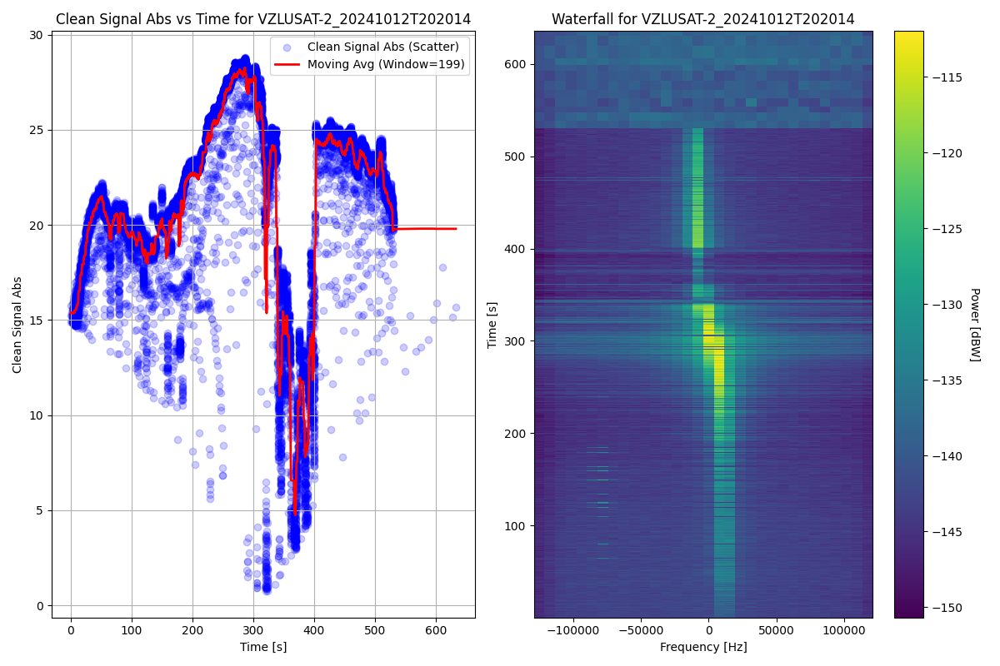

In [66]:
# for i in range(len(obj_act)):
for i in range(1):
    n=obj_act[i]
    
    for t in range(1):
        # Ensure clean_sig_abs is 1D
        clean_sig_abs = np.squeeze(n.clean_sig_abs)
        window_size = 199   #
        padded_signal = np.pad(clean_sig_abs, pad_width=window_size // 2, mode='reflect')
        moving_avg = np.convolve(padded_signal, np.ones(window_size) / window_size, mode='valid')
        time_ax_avg = obj_act[i].time_ax[:len(moving_avg)]


        # Create the figure and subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 8))  # 1 row, 2 columns

        # Plot the clean signal and moving average in the first subplot
        axes[0].scatter(n.time_ax, clean_sig_abs, label='Clean Signal Abs (Scatter)', color='blue', alpha=0.2)
        axes[0].plot(time_ax_avg, moving_avg, label=f'Moving Avg (Window={window_size})', color='red', linewidth=2)
        axes[0].set_xlabel('Time [s]')
        axes[0].set_ylabel('Clean Signal Abs')
        axes[0].set_title(f'Clean Signal Abs vs Time for {n.filename}')
        axes[0].legend()
        axes[0].grid(True)

        # Plot the waterfall in the second subplot
        power_log = 10 * np.log10(n.noise_obj.waterfall)
        power_log = np.squeeze(power_log)
        pcol = axes[1].pcolormesh(n.noise_obj.freqs, n.time_ax, power_log, shading='auto', cmap='viridis')
        cbar = fig.colorbar(pcol, ax=axes[1], orientation='vertical')
        cbar.ax.get_yaxis().labelpad = 15
        cbar.ax.set_ylabel("Power [dBW]", rotation=270)

        axes[1].set_title("Waterfall for " + n.filename)
        axes[1].set_xlabel("Frequency [Hz]")
        axes[1].set_ylabel("Time [s]")

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()
        plt.savefig('Old_data_with_noise.png', dpi=225)           # Save as png


        # squared_errors = (clean_sig_abs - moving_avg) ** 2  # Compute squared errors

        # plt.figure(figsize=(10, 6))
        # plt.scatter(n.time_ax, squared_errors, label='Squared Errors', color='red', alpha=0.2)
        # plt.xlabel('Time [s]')
        # plt.ylabel('Squared Error')
        # plt.title('Squared Errors vs Time')
        # plt.legend()
        # plt.grid(True)
        # plt.show()
        


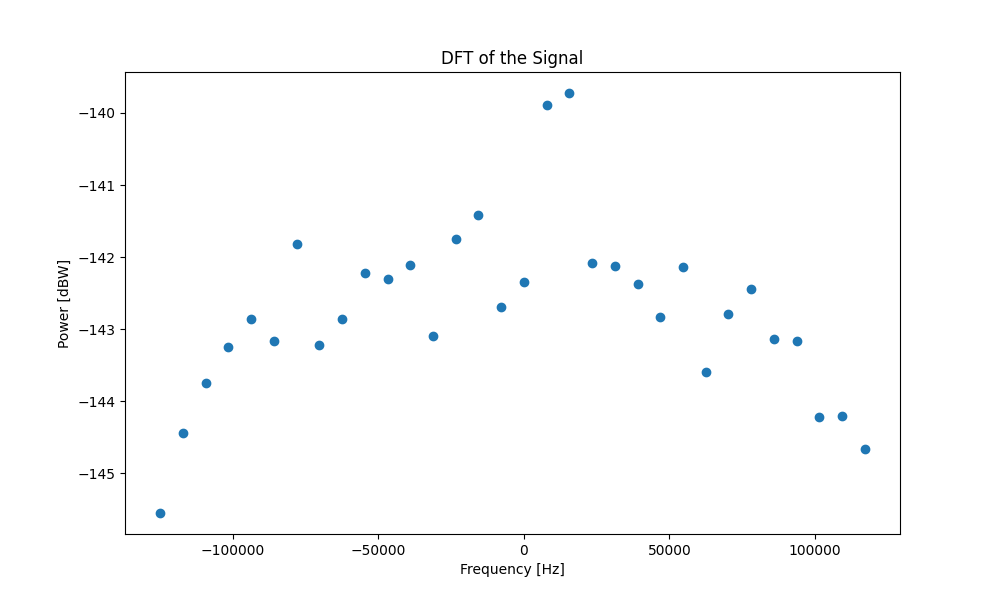

In [72]:
plt.figure(figsize=(10, 6))
plt.scatter(obj_act[0].noise_obj.freqs, 10*np.log10(obj_act[0].noise_obj.waterfall[4,:]), label='Low signal strength')
# plt.scatter(obj_act[0].noise_obj.freqs, 10*np.log10(obj_act[0].noise_obj.waterfall[3000,:]), label='high signal strength')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Power [dBW]')
# plt.legend()
plt.title('DFT of the Signal')
plt.show()
plt.savefig('fft.pdf')           # Save as png

# plot outliers 

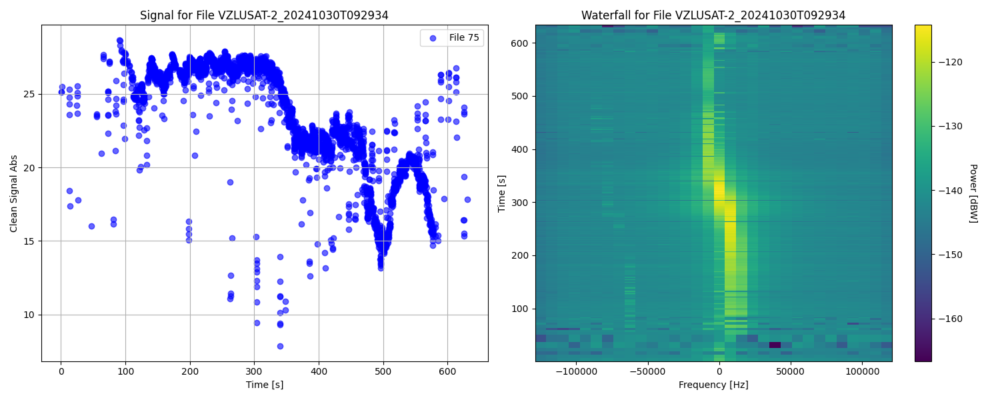

In [2]:
outlierlist = []

# # Identify outliers based on the condition
# for i, obj in enumerate(obj_act):
#     if max(obj.clean_sig_abs) > 33:  # Adjust threshold as needed
#         print(obj.filename)
#         outlierlist.append(i)
# Identify outliers based on the condition
# for i, obj in enumerate(obj_act):
#     if max(10*np.log10(obj.noise_obj.noise)) > -175.5:  # Adjust threshold as needed
#         print(obj.filename)
#         outlierlist.append(i)

bad_files = [
    "VZLUSAT-2_20241030T092934" ]

for i, obj in enumerate(obj_act):
    if obj.filename in bad_files:
        outlierlist.append(i)
# Plot each outlier
import matplotlib.pyplot as plt

for i in outlierlist[:10]:
    # Create a figure with two subplots side by side (1 row, 2 columns)
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # First subplot for the scatter plot of signal data
    axes[0].scatter(obj_act[i].time_ax, obj_act[i].clean_sig_abs, label=f'File {i}', color='blue', alpha=0.6)
    axes[0].set_xlabel("Time [s]")
    axes[0].set_ylabel("Clean Signal Abs")
    axes[0].set_title(f"Signal for File {obj_act[i].filename}")
    axes[0].legend()
    axes[0].grid(True)
    
    # Second subplot for the waterfall plot
    obj_act[i].noise_obj.plot_waterfall()  # Pass the axis to the plot method
    axes[1].set_title(f"Waterfall for File {obj_act[i].filename}")
    
    # Adjust the layout and show the figure
    plt.tight_layout()
    plt.savefig(f'figures/outlier_Noise_doppler_noise_threshold.png', dpi=225)           # Save as png
    plt.show()



# interesting attributes

obj_act[i].time_ax

obj_act[i].clean_sig_abs

obj_act[i].pointing_error

obj_act[i].station_obj.azimuth

obj_act[i].station_obj.elevation

obj_act[i].station_obj.fspl

obj_act[i].noise_obj.noise

Amounth of points: 456086
Amounth of points: 456086
Amounth of points: 456086


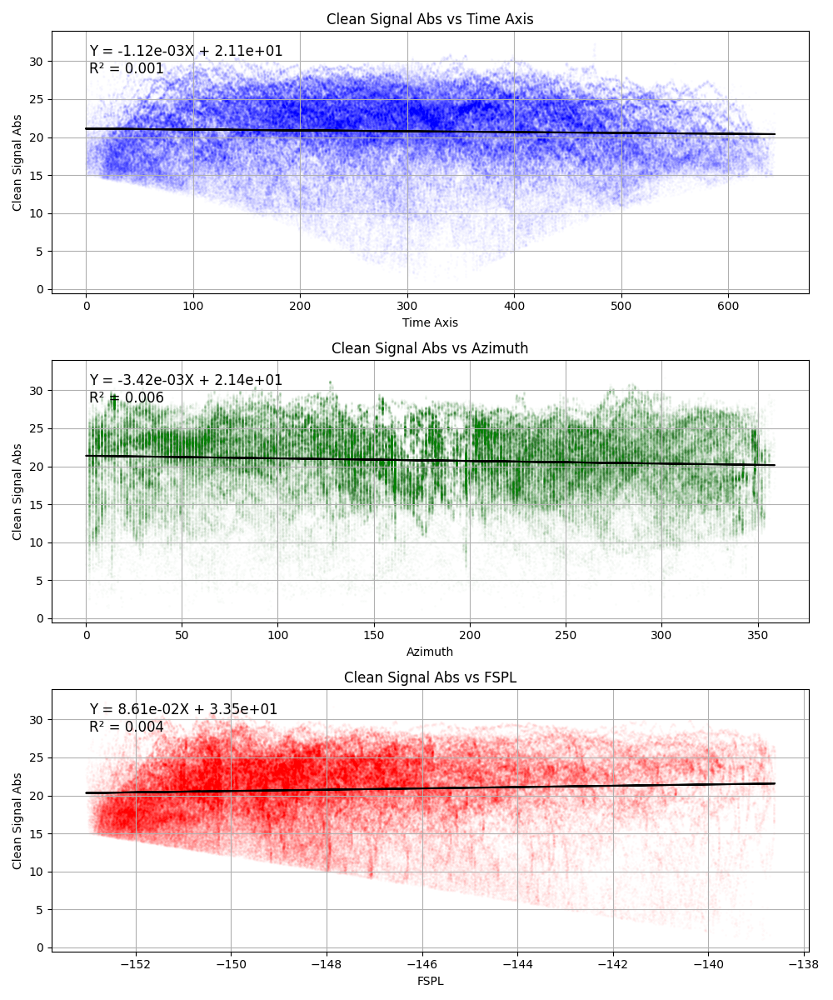

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize plots for all features
fig, axs = plt.subplots(3, 1, figsize=(10, 12), sharex=False)

# Titles for each plot
titles = [
    'Clean Signal Abs vs Time Axis',
    'Clean Signal Abs vs Azimuth',
    'Clean Signal Abs vs FSPL'
    # 'Clean Signal Abs vs Pointing Error',
    # 'Clean Signal Abs vs Noise',
    # 'Clean Signal Abs vs Elevation',
]

# Colors for points
colors = ['b', 'g', 'r', 'c', 'm', 'y']

# Initialize empty lists to aggregate all the data
y_vals_all = []

# Initialize y_vals_all with empty lists for each feature
x_vals_all = [[] for _ in range(6)]

# Loop through objects and add points to each plot
for obj in obj_act:
    # Collecting all data into the aggregated lists
    y_vals_all.extend(obj.clean_sig_abs)
    
    # For each plot, collect the corresponding feature as y-values
    x_vals_all[0].extend(obj.time_ax)  # For Time Axis
    x_vals_all[1].extend(obj.station_obj.azimuth)  # For Azimuth
    x_vals_all[2].extend(obj.station_obj.fspl)  # For FSPL
    # x_vals_all[3].extend(obj.pointing_error)  # For Pointing Error
    # x_vals_all[4].extend(10*np.log10(obj.noise_obj.noise))  # For Noise
    # x_vals_all[5].extend(obj.station_obj.elevation)  # For Elevation

# Now we go through each plot and add a trendline based on the aggregated data
for i, ax in enumerate(axs):
    # Retrieve the feature values for this plot
    y_vals = np.array(y_vals_all).flatten()  # Flatten the list for the current feature
    
    # Convert x_vals_all into a numpy array and flatten it
    x_vals = np.array(x_vals_all[i]).flatten()
    # print(x_vals.shape)
    # print(y_vals.shape)

    # Fit a linear trendline (polynomial degree 1) to the data
    p = np.polyfit(x_vals, y_vals, 1)
    trendline = np.poly1d(p)
    print(f"Amounth of points: {len(x_vals)}")
    # Plot the aggregated points and trendline
    ax.scatter(x_vals, y_vals, alpha=0.01,s=2, color=colors[i], label=f'All Data {titles[i]}')
    ax.plot(x_vals, trendline(x_vals), color='black', label='Trendline')

    # Calculate R-squared
    y_pred = trendline(x_vals)
    residuals = y_vals - y_pred
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y_vals - np.mean(y_vals))**2)
    r2 = 1 - (ss_res / ss_tot)

    # Display the trendline equation and R-squared on the plot
    ax.text(0.05, 0.95, f'Y = {p[0]:.2e}X + {p[1]:.2e}\nR² = {r2:.3f}', transform=ax.transAxes,
            fontsize=12, verticalalignment='top', color='black')

# Customize plots
for i, ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.set_xlabel(titles[i].split('vs ')[1])
    ax.set_ylabel('Clean Signal Abs')  # Extract feature name for ylabel
    ax.grid(True)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()
plt.savefig('Correlation_no_noise_no_PE.png', dpi=225)           # Save as png


# Show correlation between measured things

In [9]:
X_features=[  'Azimuth',       # 0
            'Elevation',      # 1
            'Pointing Error',  # 2
            'FSPL',      # 3
            'Noise',     # 4
            'Time',      # 5
            'Mean',      # 6
            'Slope',     # 7
            'MSE_slope', # 8
            'Poly_val',  # 9
            'MSE_poly',  # 10
            'Points',    # 11
            'Measurement']   # 12]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Combine X and X_val, Y and y_val
X_combined = np.vstack((np.vstack(X), np.vstack(X_test)))  # Stack rows vertically
Y_combined = np.hstack((np.hstack(Y),np.hstack(y_test))) # Stack arrays horizontally


# Function to plot feature vs target
def plot_features_vs_target(X, Y, feature_names, dataset_name="Training"):
    num_features = len(feature_names)
    fig, axes = plt.subplots(nrows=(num_features + 1) // 2, ncols=2, figsize=(12, num_features * 2.5))
    axes = axes.flatten()

    for i, feature in enumerate(feature_names):
        axes[i].scatter(X[:, i], Y, alpha=0.1, label='Data', color='blue', s=5)
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Target (Y)')
        axes[i].set_title(f'{feature} vs Target')
        axes[i].grid(True)

    # Remove extra axes if any
    for i in range(len(feature_names), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# Plot combined data
# plot_features_vs_target(X_combined, Y_combined, X_features, dataset_name="Combined")



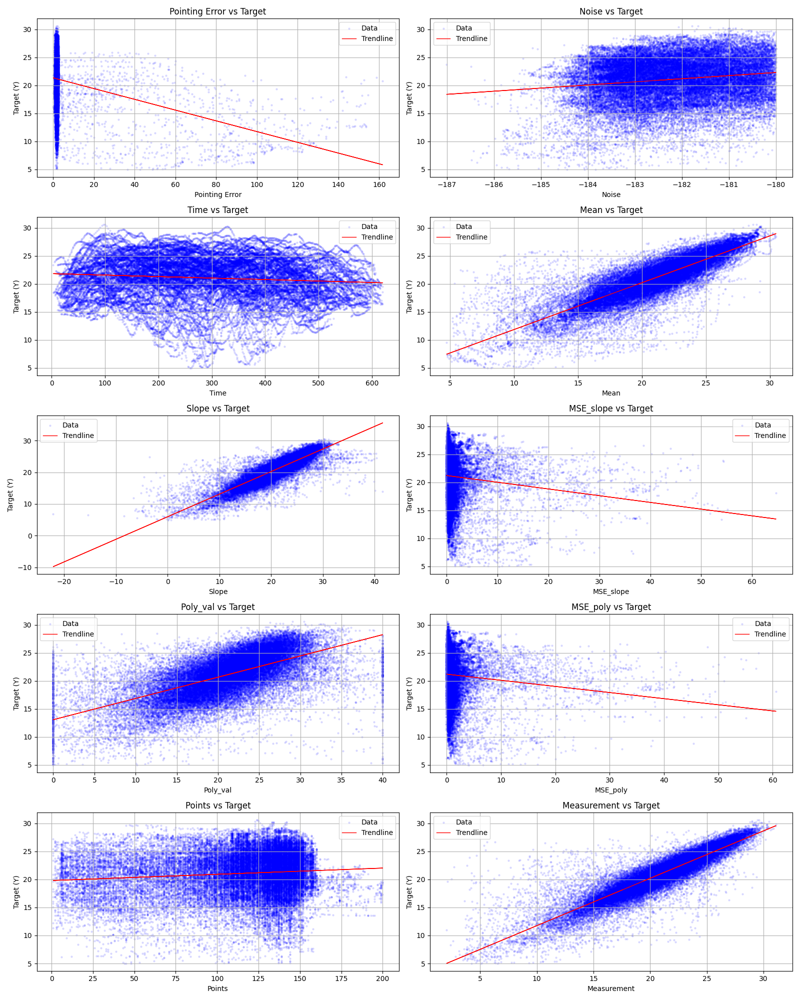

Grid plot saved as grid_plot.png


In [15]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
import seaborn as sns


# Combine X and X_val, Y and y_val
X_combined = np.vstack((np.vstack(X), np.vstack(X_test)))  # Stack rows vertically
Y_combined = np.hstack((np.hstack(Y),np.hstack(y_test))) # Stack arrays horizontally
# List of feature names
X_features = [
    'Azimuth', 'Elevation', 'Pointing Error', 'FSPL', 'Noise', 'Time', 
    'Mean', 'Slope', 'MSE_slope', 'Poly_val', 'MSE_poly', 'Points', 'Measurement'
]

# Exclude specific features
exclude_features = {'Azimuth', 'Elevation', 'FSPL'}
selected_features = [f for f in X_features if f not in exclude_features]
selected_indices = [X_features.index(f) for f in selected_features]

# Function to plot selected features vs target
def plot_selected_features(X, Y, selected_features, selected_indices, output_file="grid_plot.pdf"):
    num_features = len(selected_features)
    rows, cols = 5, 2  # 5x2 grid layout

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(16, 20))
    axes = axes.flatten()

    for i, idx in enumerate(selected_indices):
        # Scatter plot of feature vs target
        x_values = X[:, idx]
        axes[i].scatter(x_values, Y, alpha=0.1, label='Data', color='blue', s=5)
        
        # Add linear trendline
        x_values_reshaped = x_values.reshape(-1, 1)
        model = LinearRegression()
        model.fit(x_values_reshaped, Y)
        trendline = model.predict(x_values_reshaped)
        axes[i].plot(x_values, trendline, color='red', linewidth=1, label='Trendline')

        # Add labels, title, grid, and legend
        axes[i].set_xlabel(selected_features[i])
        axes[i].set_ylabel('Target (Y)')
        axes[i].set_title(f'{selected_features[i]} vs Target')
        axes[i].grid(True)
        axes[i].legend()

    # Hide any unused subplots
    for i in range(len(selected_indices), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.savefig(output_file,dpi=225)
    plt.show()
    # plt.close()
    print(f"Grid plot saved as {output_file}")

# Call the function with selected features
plot_selected_features(X_combined, Y_combined, selected_features, selected_indices, output_file="grid_plot.png")


In [47]:
# outlierlist = []
# # print(Y)
# # print(np.hstack(Y).shape)
# for i, obj in enumerate(Y):
#     if min(obj) < 10:  # Adjust threshold as needed
#         outlierlist.append(i)
# print(f"Outliers: {outlierlist}")
# last=outlierlist[-1]
# for i, obj in enumerate(y_val):
#     if min(obj) < 10:  # Adjust threshold as needed
#         outlierlist.append(i+last)

# print(f"Outliers: {outlierlist}")
# discard_pile = []
# for i in outlierlist:
#     discard_pile.append(obj_act[i].filename)
#     obj_act[i].noise_obj.waterfall=np.squeeze(obj_act[i].noise_obj.waterfall)
#     plt.figure()
#     obj_act[i].noise_obj.plot_waterfall()
#     plt.show()
#     plt.figure()
#     plt.scatter(obj_act[i].time_ax,obj_act[i].pointing_error)
#     plt.scatter(obj_act[i].time_ax,obj_act[i].target)
#     plt.show()
    

# print(discard_pile)





In [49]:

def remove_outlier(obj):
    outlier_indices = []
    # valid_range_bins = int(2 * 11e3 / (250e3 / obj.noise_obj.fft_size))  # Total valid bins for the maximum doppler shift of Â±11kHz when sampling rate is 250kHz
    signal_bandwidth =15e3 #evaluated from fft
    # print(f"Filled bins {np.round(signal_bandwidth/(250e3/obj.noise_obj.fft_size))}")
    valid_range_bins=np.round(signal_bandwidth/(250e3/obj.noise_obj.fft_size))
    
    sp=np.zeros(len(obj.noise_obj.waterfall))
    noipow=np.zeros(len(obj.noise_obj.waterfall))
    #initialise speed
    speed=(obj.station_obj.dist[1]-obj.station_obj.dist[0])/(obj.time_ax[1]-obj.time_ax[0])

    for i , row in enumerate(obj.noise_obj.waterfall):
        if i !=0:
            speed = (obj.station_obj.dist[i]-obj.station_obj.dist[i-1])/(obj.time_ax[i]-obj.time_ax[i-1])
            # print(f"startspeed {startspeed}")

        dopplershift=-((speed)/3e8)*obj.station_obj._freq
        # print(f"Doppler shift {dopplershift}")
        center_bin = np.round(obj.noise_obj.fft_size/2) + np.round((dopplershift) / (250e3 / obj.noise_obj.fft_size)) # center freq is the 17th index.
        # print(f"center freq {center_bin}")


        fft_data =  10*np.log10(np.squeeze(row))  # FFT data (magnitude spectrum)
        # center_bin = obj.noise_obj.fft_size // 2  # Center bin of the FFT, integer division to get an actual number

        # Determine valid bin range for Doppler effect
        valid_min = int(center_bin - (valid_range_bins // 2))
        valid_max = int(center_bin + (valid_range_bins // 2)) + 1 # +1 to include the last bin
        # print(f"valid min {valid_min} valid max {valid_max}")

        # Extract FFT values in the valid range
        valid_fft_values = fft_data[valid_min:valid_max]
        invalid_fft_values = np.concatenate((fft_data[:valid_min], fft_data[valid_max:]))
        # Find the maximum value in the valid range
        signal_power = np.mean(valid_fft_values)
        noise_power=np.mean(invalid_fft_values)
        sp[i]=signal_power
        noipow[i]=noise_power

        # plt.figure()
        # plt.scatter(obj.noise_obj.freqs[valid_min:valid_max],valid_fft_values,label="Signal power to noise power")
        # plt.scatter(np.concatenate((obj.noise_obj.freqs[:valid_min], obj.noise_obj.freqs[valid_max:])),invalid_fft_values,label="Signal power to noise power")
        # plt.show()

        if (signal_power-noise_power>3):
            outlier_indices.append(i) #If the peak is gucci, then we keep it
        
    
    # plt.figure()
    # plt.scatter(obj.time_ax,sp-noipow,label="Signal power to noise power",alpha=0.2)
    # plt.show()
    # plt.figure()
    # plt.scatter(obj.time_ax,noipow,label="Noise power")
    # # plt.scatter(obj.time_ax,sp-noipow,label="Signal power to noise power")
    # plt.show()

    # print(f"outlier_indices {outlier_indices}")
    return obj[outlier_indices]#Basically deleting all the points where it was not transmitting

new_obj_act = []
for d in outlierlist:
    new_obj_act.append(remove_outlier(obj_act[d]))


# Try to find any correlation between spin and passes

In [9]:

for i in range(80):
    obj_act[i].Max_ele=max(obj_act[i].station_obj.elevation)
    idx= np.argmax(obj_act[i].station_obj.elevation)
    obj_act[i].Azi_at_max=obj_act[i].station_obj.azimuth[idx]
    freq, pow = LombScargle(time, values).autopower(normalization='standard')
    freq=freq[:1000]
    pow=pow[:1000]
    obj_act[i].max_spin_freq=freq[np.argmax(pow)]


# attempt to find the rotation axis from the time of no fading

satellite pass GRBALPHA_20241118T230433
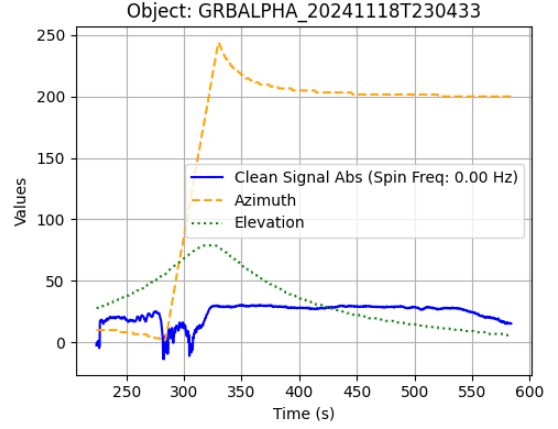
for obj in obj_act
    print(obj.filename)

78
GRBALPHA_20241118T230433


C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_43532\443596730.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


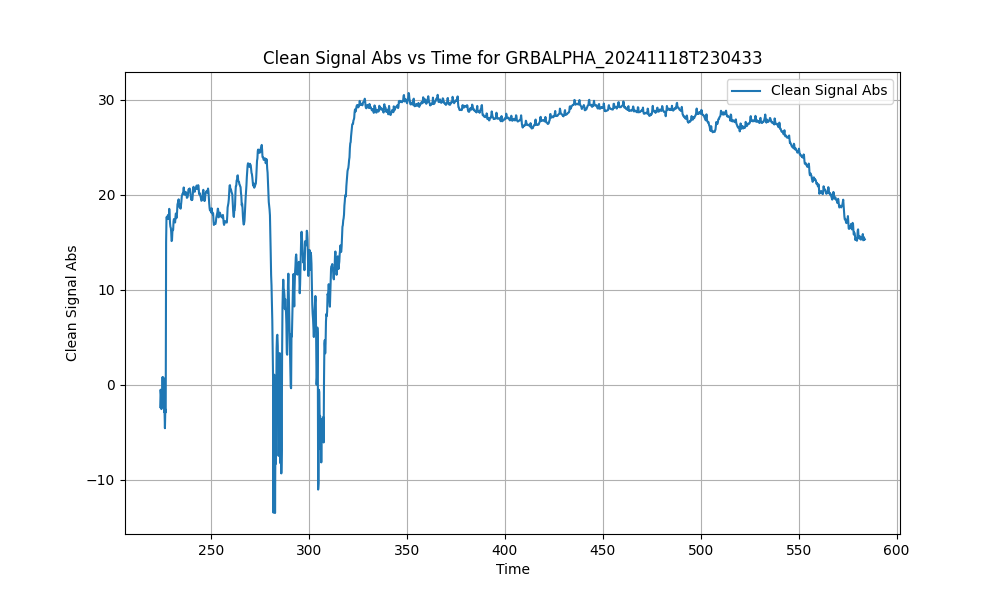

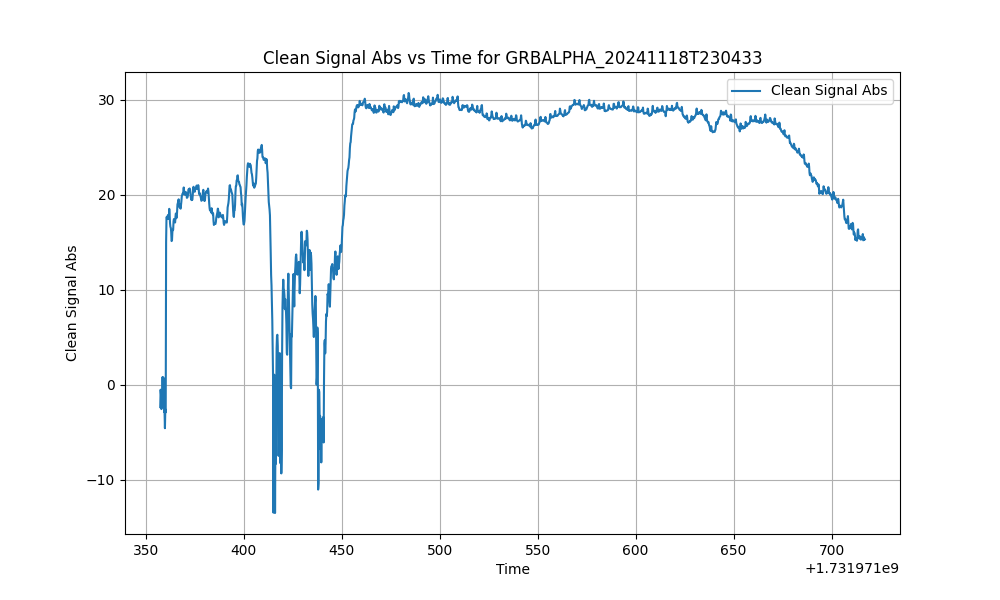

WGS84 latitude +57.0140 N longitude 9.9860 E elevation 20.0 m


In [12]:
for i,obj in enumerate(obj_act):
    if obj.filename == 'GRBALPHA_20241118T230433':
        print(i)
        print(obj.filename)
        plt.figure(figsize=(10, 6))
        plt.plot(obj.time_ax, obj.clean_sig_abs, label='Clean Signal Abs')
        plt.xlabel('Time')
        plt.ylabel('Clean Signal Abs')
        plt.title('Clean Signal Abs vs Time for GRBALPHA_20241118T230433')
        plt.legend()
        plt.grid(True)
        plt.show()
        plt.figure(figsize=(10, 6))
        plt.plot(obj.station_obj.timestamps, obj.clean_sig_abs, label='Clean Signal Abs')
        plt.xlabel('Time')
        plt.ylabel('Clean Signal Abs')
        plt.title('Clean Signal Abs vs Time for GRBALPHA_20241118T230433')
        plt.legend()
        plt.grid(True)
        plt.show()
        print(obj_act[i].station_obj._station_pos)

In [13]:
from skyfield.api import wgs84, load
import numpy as np

# Ground station coordinates (latitude, longitude, altitude)

passindex=78
obj=obj_act[passindex]

station =obj.station_obj._station_pos


# Observed azimuth and elevation
azimuth_degrees = obj.station_obj.azimuth
elevation_degrees = obj.station_obj.elevation

# Time of observation
ts = load.timescale()
time = obj.station_obj.timestamps
print(time)
# Step 1: Horizon vector (local frame)
azimuth_rad = np.radians(azimuth_degrees)
elevation_rad = np.radians(elevation_degrees)
v_horizon = np.array([
    np.cos(elevation_rad) * np.sin(azimuth_rad),  # North
    np.cos(elevation_rad) * np.cos(azimuth_rad),  # East
    np.sin(elevation_rad)                          # Zenith
])

# Step 2: Transform to ECEF
v_ecef = station.to_ecef_matrix() @ v_horizon

# Step 3: Transform to ECI
rotation_matrix = wgs84.rotation_at(time)
v_eci = rotation_matrix.T @ v_ecef

# Normalize (optional)
v_eci_normalized = v_eci / np.linalg.norm(v_eci)

print(f"Rotation axis in ECI: {v_eci_normalized}")


[[1.73197136e+09]
 [1.73197136e+09]
 [1.73197136e+09]
 ...
 [1.73197172e+09]
 [1.73197172e+09]
 [1.73197172e+09]]


AttributeError: 'GeographicPosition' object has no attribute 'to_ecef_matrix'

# weak attempt to try to model any kind of rotation axis

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# --- Input Data ---
# Time series (in seconds)
time = np.linspace(0, 100, 1000)  # Example time array

# Azimuth (radians), Elevation (radians), and Distance (km) arrays
azimuth = np.radians(np.linspace(0, 360, len(time)))  # Example azimuth
elevation = np.radians(45 + 10 * np.sin(2 * np.pi * time / 50))  # Example elevation
distance = 700 + 10 * np.cos(2 * np.pi * time / 50)  # Example distance (km)

# Observed signal strength (normalize or use actual measurements)
signal_obs = 10 + 3 * np.sin(2 * np.pi * time / 10) + 0.5 * np.random.randn(len(time))

# --- Step 1: Compute Line-of-Sight Vector ---
def compute_los(azimuth, elevation, distance):
    """Compute line-of-sight vector in Cartesian coordinates."""
    x = distance * np.cos(elevation) * np.cos(azimuth)
    y = distance * np.cos(elevation) * np.sin(azimuth)
    z = distance * np.sin(elevation)
    return np.vstack((x, y, z)).T  # Shape: (N, 3)

los_vectors = compute_los(azimuth, elevation, distance)

# --- Step 2: Define Satellite Rotation Model ---
def rotation_matrix(axis, angle):
    """Create a 3D rotation matrix for a given axis and angle."""
    axis = axis / np.linalg.norm(axis)  # Normalize axis
    cos_theta = np.cos(angle)
    sin_theta = np.sin(angle)
    ux, uy, uz = axis
    return np.array([
        [cos_theta + ux**2 * (1 - cos_theta), ux*uy*(1 - cos_theta) - uz*sin_theta, ux*uz*(1 - cos_theta) + uy*sin_theta],
        [uy*ux*(1 - cos_theta) + uz*sin_theta, cos_theta + uy**2 * (1 - cos_theta), uy*uz*(1 - cos_theta) - ux*sin_theta],
        [uz*ux*(1 - cos_theta) - uy*sin_theta, uz*uy*(1 - cos_theta) + ux*sin_theta, cos_theta + uz**2 * (1 - cos_theta)],
    ])

def predict_signal(axis, period, los_vectors, time):
    """Predict signal strength based on rotation and LOS vector."""
    omega = 2 * np.pi / period  # Angular velocity
    signal_pred = []
    for t, los in zip(time, los_vectors):
        # Rotate the satellite's body frame (assume initial pattern is along Z-axis)
        rot_mat = rotation_matrix(axis, omega * t)
        rotated_pattern = rot_mat @ np.array([0, 0, 1])  # Example pattern direction
        # Project onto LOS vector
        signal_strength = np.dot(rotated_pattern, los / np.linalg.norm(los))  # Simplified model
        signal_pred.append(signal_strength)
    return np.array(signal_pred)

# --- Step 3: Optimization to Fit Rotation Axis ---
def error_function(params, los_vectors, time, signal_obs):
    """Error function to minimize."""
    axis = params[:3]
    period = params[3]
    signal_pred = predict_signal(axis, period, los_vectors, time)
    return np.sum((signal_obs - signal_pred)**2)

# Initial guesses for rotation axis and period
initial_guess = [0, 0, 1, 10]  # Assume Z-axis and 10s period

# Optimize
result = minimize(error_function, initial_guess, args=(los_vectors, time, signal_obs), method='Nelder-Mead')
optimized_params = result.x
optimized_axis = optimized_params[:3]
optimized_period = optimized_params[3]

print(f"Optimized Rotation Axis: {optimized_axis}")
print(f"Optimized Rotation Period: {optimized_period:.2f} seconds")

# --- Step 4: Visualize Results ---
signal_pred = predict_signal(optimized_axis, optimized_period, los_vectors, time)

plt.figure(figsize=(10, 5))
plt.plot(time, signal_obs, label='Observed Signal', alpha=0.7)
plt.plot(time, signal_pred, label='Predicted Signal', linestyle='--')
plt.xlabel('Time (s)')
plt.ylabel('Signal Strength')
plt.legend()
plt.title('Signal Strength vs Time')
plt.show()

def dipole_pattern(dipole_axis, los_vector):
    """
    Calculate the dipole radiation pattern strength for a given LOS vector.
    :param dipole_axis: Axis of the dipole in satellite body frame (normalized vector).
    :param los_vector: Line-of-sight vector from the ground station to the satellite (normalized vector).
    :return: Dipole radiation strength (proportional to sin^2(theta')).
    """
    cos_theta = np.dot(dipole_axis, los_vector) / (np.linalg.norm(dipole_axis) * np.linalg.norm(los_vector))
    theta = np.arccos(np.clip(cos_theta, -1.0, 1.0))  # Ensure within valid range for acos
    return np.sin(theta)**2

def predict_signal_dipole(axis, period, los_vectors, time):
    """
    Predict signal strength using a dipole radiation pattern.
    :param axis: Rotation axis of the satellite.
    :param period: Rotation period of the satellite (seconds).
    :param los_vectors: Line-of-sight vectors to the satellite.
    :param time: Time array.
    :return: Predicted signal strength array.
    """
    omega = 2 * np.pi / period  # Angular velocity
    signal_pred = []
    for t, los in zip(time, los_vectors):
        # Rotate the satellite's body frame (assume dipole initially along Z-axis)
        rot_mat = rotation_matrix(axis, omega * t)
        rotated_dipole = rot_mat @ np.array([0, 0, 1])  # Dipole starts along Z-axis
        # Calculate dipole pattern strength
        signal_strength = dipole_pattern(rotated_dipole, los)
        signal_pred.append(signal_strength)
    return np.array(signal_pred)

# Update error function to use the dipole signal prediction
def error_function_dipole(params, los_vectors, time, signal_obs):
    """Error function to minimize for dipole pattern."""
    axis = params[:3]
    period = params[3]
    signal_pred = predict_signal_dipole(axis, period, los_vectors, time)
    return np.sum((signal_obs - signal_pred)**2)

# Optimize for the dipole case
initial_guess = [0, 0, 1, 10]  # Assume Z-axis and 10s period
result_dipole = minimize(error_function_dipole, initial_guess, args=(los_vectors, time, signal_obs), method='Nelder-Mead')
optimized_params_dipole = result_dipole.x
optimized_axis_dipole = optimized_params_dipole[:3]
optimized_period_dipole = optimized_params_dipole[3]

print(f"Optimized Dipole Rotation Axis: {optimized_axis_dipole}")
print(f"Optimized Dipole Rotation Period: {optimized_period_dipole:.2f} seconds")

# Predict and plot results
signal_pred_dipole = predict_signal_dipole(optimized_axis_dipole, optimized_period_dipole, los_vectors, time)

plt.figure(figsize=(10, 5))
plt.plot(time, signal_obs, label='Observed Signal', alpha=0.7)
plt.plot(time, signal_pred_dipole, label='Predicted Dipole Signal', linestyle='--')
plt.xlabel('Time (s)')
plt.ylabel('Signal Strength')
plt.legend()
plt.title('Dipole Signal Strength vs Time')
plt.show()


NameError: name 'minimize' is not defined

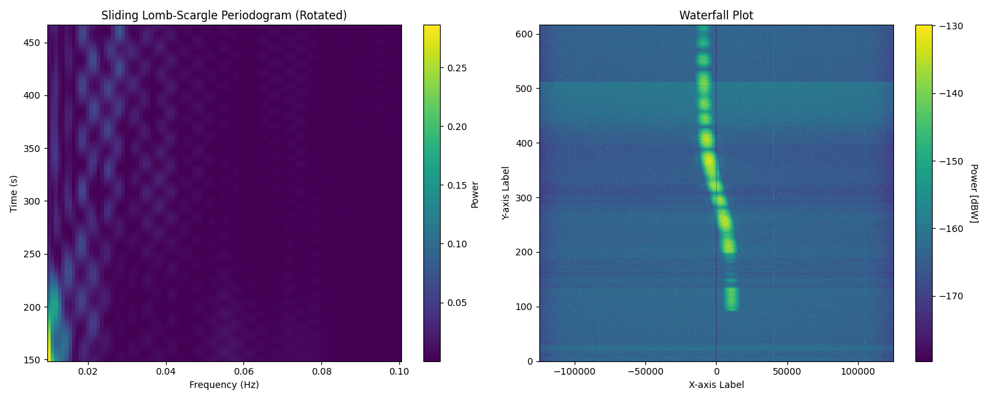

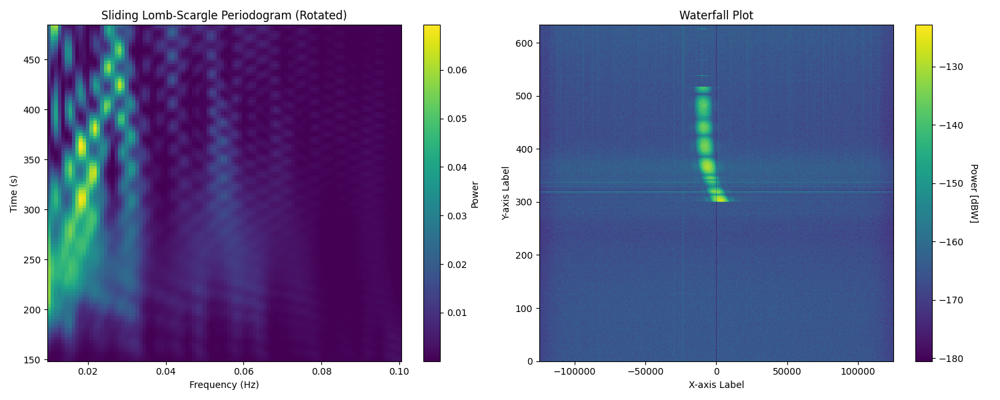

MemoryError: Unable to allocate 396. MiB for an array with shape (3164, 4096, 4) and data type float64

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

MemoryError: Unable to allocate 99.1 MiB for an array with shape (3172, 4095) and data type float64

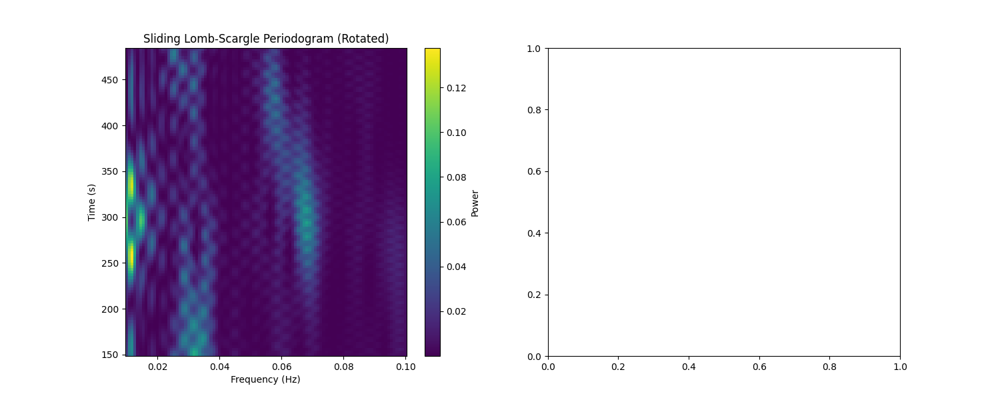

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.timeseries import LombScargle
from scipy.signal import windows

for obj in obj_act_top10[:4]:
    # Example time-series data (time and values)
    time = obj.time_ax.flatten()
    values = obj.clean_sig_abs.flatten()

    # Parameters
    window_length = 300  # Length of each window in seconds
    overlap_ratio = 0.99  # 50% overlap
    min_frequency = 0.01  # Minimum frequency for Lomb-Scargle
    max_frequency = 0.1   # Maximum frequency for Lomb-Scargle
    frequency_resolution = 100  # Number of frequency points

    # Calculate step size based on overlap
    step_size = window_length * (1 - overlap_ratio)

    # Sliding windows
    start_times = np.arange(time[0], time[-1] - window_length, step_size)
    frequencies = np.linspace(min_frequency, max_frequency, frequency_resolution)

    # Initialize results
    time_centers = []
    power_spectra = []

    for start_time in start_times:
        # Define the current window
        end_time = start_time + window_length
        mask = (time >= start_time) & (time < end_time)
        window_time = time[mask]
        window_values = values[mask]
        
        if len(window_time) > 0:
            # Apply Hamming window
            hamming_weights = windows.hamming(len(window_time))
            weighted_values = window_values * hamming_weights
            
            # Perform Lomb-Scargle analysis
            ls = LombScargle(window_time, weighted_values,normalization='standard')
            power = ls.power(frequencies)
            
            # Store results
            time_centers.append((start_time + end_time) / 2)
            power_spectra.append(power)

    # Convert results to numpy arrays
    time_centers = np.array(time_centers)
    power_spectra = np.array(power_spectra)


    # Set up the figure with two subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Plot 1: Sliding Lomb-Scargle Periodogram (Rotated)
    im1 = axes[0].pcolormesh(frequencies, time_centers, power_spectra, shading='auto', cmap='viridis')
    axes[0].set_xlabel('Frequency (Hz)')
    axes[0].set_ylabel('Time (s)')
    axes[0].set_title('Sliding Lomb-Scargle Periodogram (Rotated)')
    fig.colorbar(im1, ax=axes[0], label='Power')

    # Optional: Invert axes if needed
    # axes[0].invert_yaxis()
    # axes[0].invert_xaxis()

    # Plot 2: Waterfall plot (placeholder for obj_act_top10[0].noise_obj.plot_waterfall())
    # Replace this with the actual method or logic of your object
    obj.noise_obj.plot_waterfall()

    # Customize subplot
    axes[1].set_title('Waterfall Plot')
    axes[1].set_xlabel('X-axis Label')  # Replace with actual label
    axes[1].set_ylabel('Y-axis Label')  # Replace with actual label

    # Show the combined plots
    plt.tight_layout()
    plt.show()

